# Cellworld figures
Run this cell first to install all the prerequisites and create the common classes and functions.



In [ ]:
# @title Prerequisites installation
!pip install cellworld
!pip install scikit_posthocs

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for cellworld: filename=cellworld-0.0.381-py3-none-any.whl size=29141 sha256=61ee8eff53d19710059c2ba8426225975d965fe52922964e8c7766f040db7ec0
  Stored in directory: /root/.cache/pip/wheels/62/b7/22/a6cd201bf0e6d364568bb114e109c08c7c08b4aaadff5065f1
  Created wheel for json-cpp: filename=json_cpp-1.0.134-py3-none-any.whl size=12069 sha256=6567d501b319117f94506fbd9cdf6fe8a38beb27fecb2119d7d6204454d9e90b
  Stored in directory: /root/.cache/pip/wheels/bc/ca/2c/f7c8b38db757ed35c1b2012b29ac6f0a70a8e276bed55444e9
  Created wheel for tcp-messages: filename=tcp_messages-1.0.56-py3-none-any.whl size=8940 sha256=82c6f68ae4f32384a4b6f8ab176f71f1cdbaa077b788042554b5de3804dfbffd
  Stored in directory: /root/.cache/pip/wheels/81/64/4c/16177fddc75cd81e43e394bdd2fa0fa86eab3a3a14b3962f22
Successfully built cellworld json-cpp tcp-messages


#Main Figures

##Figure 2

Generate the data (90-120 minutes) or download precomputed (<1 second) (g/D):D


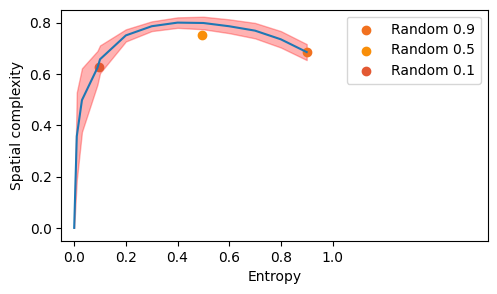

In [ ]:
# @title Panel E: Generated Worlds Complexity vs Standard Configurations
%reset -f

# Common cell setup

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

# Figure code

import matplotlib as mpl
import matplotlib.pyplot as plt
from cellworld import *
import numpy as np

gen_or_download = input("Generate the data (90-120 minutes) or download precomputed (<1 second) (g/D):")
entropies = [.01, .03, .09, .1, .2, .3, .4, .5, .6, .7, .8, .9]
configurations = ['y-maze', 'gator', 'hairpin', 'radial arm', 'corridor', 'Random 0.9', 'Random 0.5', 'Random 0.1', 'open_field']
configuration_files = ['y_maze_filled.json', 'gator_filled.json', 'hairpin.json', 'radial_arm_filled.json', 'corridor_filled.json', 'hex9.json', 'hex5.json', 'hex1.json', 'open_field.json']

ComplexityList = JsonList.create_type(list_item_type=float)
EntropyList = JsonList.create_type(list_item_type=float)
EntropyComplexityList = JsonList.create_type(list_item_type=ComplexityList)

from cellworld import *


if gen_or_download == "g":
    datapoints = 500
    entropy_complexity = EntropyComplexityList([ComplexityList() for e in entropies])
    threads = []

    def compute_entropy_complexity(c: ComplexityList, ent: float, datapoints: int, seed: int):
        world = World.get_from_parameters_names("hexagonal", "canonical")
        for i in range(datapoints):
            world.create_occlusions(ent, seed=seed + i)
            c.append(Graph.create_visibility_graph(world, True).complexity(normalized=True))
            print("entropy %f (%i of %i)" % (ent, i+1, datapoints))

    from threading import Thread
    print("Launching Threads")
    for i, e in enumerate(entropies):
        threads.append(Thread(target=compute_entropy_complexity, args=(entropy_complexity[i], e, datapoints, i*100)))
        threads[-1].start()

    print("Computing complexity of generated worlds")
    for t in threads:
        t.join()
    entropy_complexity.save("fig2_panelE_gen_worlds_complexity.json")


    configurations_complexity = ComplexityList()
    configurations_entropy = EntropyList()
    world = World.get_from_parameters_names("hexagonal", "canonical")

    for c, f in zip(configurations, configuration_files):
        print("Computing entropy for configuration %s" % c)
        occlusion_file_path = "maps/%s" % f
        DownloadDataFile(occlusion_file_path)
        local_path = DataFile(occlusion_file_path)
        occlusions = Cell_group_builder().load_from_file(local_path)
        p = len(occlusions)/len(world.cells)
        ent = probability_entropy([p, 1-p], 2)
        configurations_entropy.append(ent)
    configurations_entropy.save(DataFile("fig2_panelE_configurations_entropy.json"))

    for c, f in zip(configurations, configuration_files):
        print("Computing complexity for configuration %s" % c)
        occlusion_file_path = "maps/%s" % f
        local_path = DataFile(occlusion_file_path)
        occlusions = Cell_group_builder().load_from_file(local_path)
        world.set_occlusions(occlusions)
        configurations_complexity.append(Graph.create_visibility_graph(world).complexity(normalized=True))
    configurations_complexity.save(DataFile("fig2_panelE_configurations_complexity.json"))
    print("Data ready")

else:
    DownloadDataFile("fig2_panelE_gen_worlds_complexity.json")
    entropy_complexity = EntropyComplexityList().load_from_file(DataFile("fig2_panelE_gen_worlds_complexity.json"))
    DownloadDataFile("fig2_panelE_configurations_complexity.json")
    configurations_complexity = ComplexityList().load_from_file(DataFile("fig2_panelE_configurations_complexity.json"))
    DownloadDataFile("fig2_panelE_configurations_entropy.json")
    configurations_entropy = EntropyList().load_from_file(DataFile("fig2_panelE_configurations_entropy.json"))

x = [0] + entropies
y = [0] + [sum(x) / len(x) if len(x) > 0 else 0 for x in entropy_complexity]
er = [0] + [np.std(x) for x in entropy_complexity]

fig, ax = plt.subplots(1, 1, figsize=(5.5, 3))
ax.plot(x, y)
cmap = plt.cm.inferno
norm = mpl.colors.Normalize(vmin=0, vmax=2)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
ax.set_ylabel('Spatial complexity')
ax.set_xlabel('Entropy')
ax.set_ylim([-0.05,.85])
ax.set_xlim([-0.05,1.6])
ax.set_xticks([i/10 for i in range(0,11,2)])
ax.fill_between(x, [c-e for c, e in zip(y, er)], [c+e for c, e in zip(y, er)], color="red", alpha=.3)
for cx, cy, key in zip(configurations_entropy,configurations_complexity, configurations):
  if "Random" in key:
    ax.scatter(cx, cy, label=key, color=cmap(cy))

plt.legend()
plt.show()

Generate the data (90-120 minutes) or download precomputed (<1 second) (g/D):D


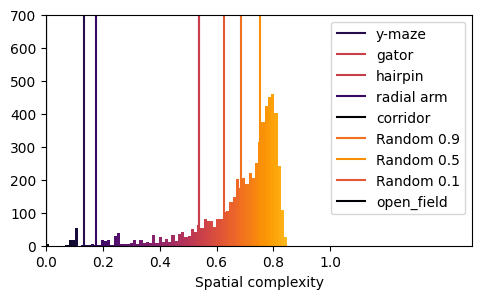

In [ ]:
# @title Panel F: Generated Worlds Complexity histogram


# Common cell setup
%reset -f

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code

import matplotlib as mpl
import matplotlib.pyplot as plt
from cellworld import *
import numpy as np

gen_or_download = input("Generate the data (90-120 minutes) or download precomputed (<1 second) (g/D):")
entropies = [.01, .03, .09, .1, .2, .3, .4, .5, .6, .7, .8, .9]
configurations = ['y-maze', 'gator', 'hairpin', 'radial arm', 'corridor', 'Random 0.9', 'Random 0.5', 'Random 0.1', 'open_field']
configuration_files = ['y_maze_filled.json', 'gator_filled.json', 'hairpin.json', 'radial_arm_filled.json', 'corridor_filled.json', 'hex9.json', 'hex5.json', 'hex1.json', 'open_field.json']

ComplexityList = JsonList.create_type(list_item_type=float)
EntropyList = JsonList.create_type(list_item_type=float)
EntropyComplexityList = JsonList.create_type(list_item_type=ComplexityList)

if gen_or_download == "g":
    datapoints = 500
    entropy_complexity = EntropyComplexityList([ComplexityList() for e in entropies])
    threads = []

    def compute_entropy_complexity(c: ComplexityList, ent: float, datapoints: int, seed: int):
        world = World.get_from_parameters_names("hexagonal", "canonical")
        for i in range(datapoints):
            world.create_occlusions(ent, seed=seed + i)
            c.append(Graph.create_visibility_graph(world, True).complexity(normalized=True))
            print("entropy %f (%i of %i)" % (ent, i+1, datapoints))

    from threading import Thread
    print("Launching Threads")
    for i, e in enumerate(entropies):
        threads.append(Thread(target=compute_entropy_complexity, args=(entropy_complexity[i], e, datapoints, i*100)))
        threads[-1].start()

    print("Computing complexity of generated worlds")
    for t in threads:
        t.join()
    entropy_complexity.save("fig2_panelE_gen_worlds_complexity.json")


    configurations_complexity = ComplexityList()
    configurations_entropy = EntropyList()
    world = World.get_from_parameters_names("hexagonal", "canonical")

    for c, f in zip(configurations, configuration_files):
        print("Computing complexity for configuration %s" % c)
        occlusion_file_path = "maps/%s" % f
        DownloadDataFile(occlusion_file_path)
        local_path = DataFile(occlusion_file_path)
        occlusions = Cell_group_builder().load_from_file(local_path)
        world.set_occlusions(occlusions)
        configurations_complexity.append(Graph.create_visibility_graph(world).complexity(normalized=True))
    configurations_complexity.save(DataFile("fig2_panelE_configurations_complexity.json"))
    print("Data ready")

else:
    DownloadDataFile("fig2_panelE_gen_worlds_complexity.json")
    entropy_complexity = EntropyComplexityList().load_from_file(DataFile("fig2_panelE_gen_worlds_complexity.json"))
    DownloadDataFile("fig2_panelE_configurations_complexity.json")
    configurations_complexity = ComplexityList().load_from_file(DataFile("fig2_panelE_configurations_complexity.json"))

fig, ax = plt.subplots(1, 1, figsize=(5.5,3))
ax.set_xlabel('Spatial complexity')
all_sc = [0]
for x in entropy_complexity:
    all_sc = all_sc + x
cmap = plt.cm.inferno
n, bins, patches = ax.hist(all_sc, bins=75, color='green')
bin_centers = 0.5 * (bins[:-1] + bins[1:])
col = bin_centers - min(bin_centers)
for c, p in zip(col, patches):
  plt.setp(p, 'facecolor', cmap(c))
for configuration, complexity in zip(configurations,configurations_complexity):
  ax.axvline(complexity, color=cmap(complexity), label=configuration)

plt.legend(loc=1)
ax.set_ylim([0,700])
ax.set_xlim([0, 1.5])
ax.set_xticks ([i/10 for i in range(0,11,2)])
plt.show()


##Figure 5

mean days to plateau = 4.0
STD days to plateau = 2.0615528128088303


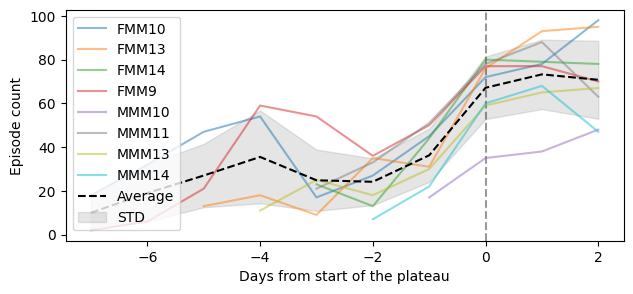

In [ ]:
# @title Panel C: Mouse progress during T

# Common cell setup
%reset -f

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code



import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import json

def plot_mouse_progress(df, metric, ax):
  grp = fil_df.groupby(['mouse','date'])[metric].count().unstack(0)
  dates = [int(date) for date in grp.index]
  all_y = []
  num_day_to_plat = []
  max_num_day = 10
  plateau_conditions = {}
  # print(grp)
  for mice in grp.columns:
    g = grp.get(mice)
    nan_ind = np.where(~np.isnan(g))[0]
    new_y = np.array([np.nan for i in range(max_num_day)])

    #ASSIGNING YVALUES
    y = g.values
    new_y[-len(nan_ind):] = np.array(g.values)[nan_ind]
    # print(new_y)
    all_y.append(new_y)
    num_day_to_plat.append(len(nan_ind)-3)
    # plat_mean = np.mean(np.array(g.values)[nan_ind[-3:]])
    # y = [val/plat_mean for val in g.values]
    # plat_y = np.array(y)[nan_ind][:]

    #ASSIGNING XVALUES
    start_dates = np.array(dates)[nan_ind[-3:]]
    plateau_conditions[mice] = start_dates
    # # start_date = np.array(dates)[nan_ind[0]]
    # x = [date - start_date for date in dates]
    x = [i - nan_ind[-3] for i in range(len(g.index))]
    plat_x = np.array(x)[nan_ind][:]

    #PLOTTING
    ls = '-'
    ax.plot(x[:],y[:],ls, label=mice, linewidth = 1.5, color = mouse_color_dict[mice]['color'], alpha = 0.5)
    # ax.plot(plat_x,plat_y,ls, label=mice, linewidth = 2, color = mouse_color_dict[mice])

    # ax.plot(np.array(x)[nan_ind[-3:]],np.array(y)[nan_ind[-3:]],linewidth = 4, color ='black', alpha = 0.3)
    ax.set_xlabel('Days from start of the plateau')
    ax.set_ylabel('Episode count')

  average_y = np.nanmean(np.array(all_y), axis =0)
  error = np.nanstd(np.array(all_y), axis =0)
  ax.plot([r for r in range(-7,3)], average_y, label='Average', linewidth = 1.5, color = 'black', alpha = 1, linestyle = '--')
  ax.fill_between([r for r in range(-7,3)], average_y-error, average_y+error, color = 'grey', zorder = 0, alpha = 0.2, label = 'STD')

  print(f'mean days to plateau = {np.nanmean(np.array(num_day_to_plat))}')
  print(f'STD days to plateau = {np.nanstd(np.array(num_day_to_plat))}')
  return plateau_conditions

DownloadDataFile('full_df.hdf')
full_df = pd.read_hdf(DataFile('full_df.hdf'))

DownloadDataFile('mouse_colors_markers.txt')
with open(DataFile('mouse_colors_markers.txt'), "r") as fp:
  # Load the dictionary from the file
  mouse_color_dict = json.load(fp)

# fig,ax = plt.subplots(1, 1, figsize=(12,5))
fig,ax = plt.subplots(1, 1, figsize=(7.2,3))
ax.tick_params(axis='both', which='major')
metric = 'ep_num'
fil_df = full_df.loc[full_df['suffix'].str.contains('HT')]
HT_plat_conditions = plot_mouse_progress(fil_df, metric, ax=ax)
ax.axvline(0, color='k', zorder=0, linestyle = '--', alpha = 0.4)
# ax.plot([0,4.25],[.8,0.8],zorder=0,alpha=0.2,color='black')
rect = patches.Rectangle((-.3, 0.8), 4.25, .4, facecolor='green', alpha = 0.1,zorder=0)
rect_top = patches.Rectangle((-.3, 1.2), 4.25, .4, facecolor='red', alpha = 0.1,zorder=0)
rect_bot = patches.Rectangle((-.3, 0.8), 4.25, -.4, facecolor='red', alpha = 0.1,zorder=0)

ax.legend(loc='upper left')
plt.savefig("HT_ep_count_progress.pdf", bbox_inches='tight')
plt.show()

None


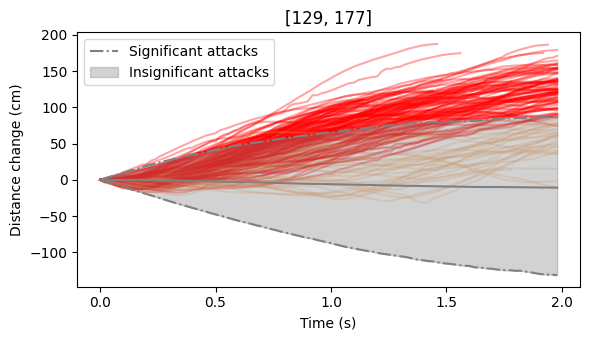

In [ ]:
# @title Panel D: Fear Response to Robot Air Puff

# Common cell setup

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  if os.path.exists(full_filename):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

experiment_files = Experiment_list

for f in experiment_files:
  DownloadDataFile(f.file)
  df = pd.read_hdf(DataFile(f.file))

#  Figure code


import matplotlib.pyplot as plt
from cellworld import *
import pandas as pd
import numpy as np


def to_cm(l):
    return [None if i is None else i * 234 for i in l]


def find_mid_location(previous_location, current_location, previous_time, current_time, step_time):
    if previous_location is None:
        return current_location
    time_diff = current_time - previous_time
    if time_diff == 0:
        return previous_location
    previous_ratio = (current_time - step_time) / time_diff
    current_ratio = (step_time - previous_time) / time_diff
    mid_location = previous_location * previous_ratio + current_location * current_ratio
    return mid_location


class TimeStreamLine(list):
    def __init__(self, trajectory: Trajectories, start_time: float, duration: float, datapoints: int, reference: Location=None):
        list.__init__(self)
        self.reference = reference
        self.datapoints = datapoints
        self.duration = duration
        self.start_time = start_time
        dpd = datapoints - 1
        locations = []
        times = JsonList(list_type=float)
        previous_location = None
        previous_time = 0
        last_location = None
        last_time = 0
        for i, s in enumerate(trajectory):
            last_location = s.location
            last_time = s.time_stamp - start_time
            if s.time_stamp < start_time:
                previous_location = s.location
                previous_time = s.time_stamp - start_time
                continue
            if s.time_stamp > start_time + duration:
                break
            times.append(s.time_stamp - start_time)
            locations.append(Location(s.location.x, s.location.y))

        if not locations:
            for i in range(self.datapoints):
                self.append(None)
            return

        time_step = duration / dpd
        current_step = 0
        for step_count in range(dpd):
            step_time = step_count * time_step
            if step_time > last_time:
                self.append(None)
                continue
            while True:
                current_location = locations[current_step]
                current_time = times[current_step]
                if current_time >= step_time:
                    break
                else:
                    previous_location = current_location
                    previous_time = current_time
                    current_step += 1
                    if current_step >= len(locations):
                        for i in range(len(self), self.datapoints):
                            self.append(None)
                        return
            step_location = find_mid_location(previous_location, current_location, previous_time, current_time, step_time)
            self.append(step_location)
        if last_time < duration:
            self.append(None)
        else:
            final_location = find_mid_location(locations[-1], last_location, times[-1], last_time, duration)
            self.append(final_location)

    def get_distances(self, reference: Location = None) -> list:
        if reference is not None:
            return [reference.dist(l)-reference.dist(self[0]) for l in self]
        if self.reference is None:
            return None
        return [None if l is None else None if self[0] is None else self.reference.dist(l)-self.reference.dist(self[0]) for l in self]

class Bundle(JsonList):
    def __init__(self, duration, datapoints):
        JsonList.__init__(self, list_type=TimeStreamLine)
        self.duration = duration
        self.datapoints = datapoints

    def add(self, trajectory: Trajectories, start_time: float, reference:Location):
        self.append(TimeStreamLine(trajectory, start_time=start_time, duration=self.duration, datapoints=self.datapoints, reference=reference))

    def get_avg_distance(self):
        distances = [tsl.get_distances() for tsl in self]
        avg_distances = [np.average([d[i] for d in distances if d[i] is not None]) for i in range(self.datapoints)]
        up_std_distances = [pd.Series([d[i] for d in distances if d[i] is not None]).quantile([0.975]).item() for i in range(self.datapoints)]
        low_std_distances = [pd.Series([d[i] for d in distances if d[i] is not None]).quantile([0.025]).item() for i in range(self.datapoints)]
        std_distances = {'up': up_std_distances, 'low': low_std_distances}
        return avg_distances, std_distances, distances

def process_episodes(episodes):
    count = 0
    mouse_bundle = Bundle(2, 100)
    mouse_random_bundle = Bundle(2, 100)
    for e in episodes:
        prey_trajectory = e.trajectories.get_agent_trajectory("prey")
        predator_trajectory = e.trajectories.get_agent_trajectory("predator")
        if not predator_trajectory:
            continue

        for rs in range(10):
            predator_sample_step = random.choice(predator_trajectory)
            mouse_random_bundle.add(prey_trajectory, predator_sample_step.time_stamp, predator_sample_step.location)
        if not e.captures:
            continue
        count += len(e.captures)
        last_capture_time = -100
        if len(e.captures) > 7:
            continue
        for capture in e.captures:
            si = 0
            while prey_trajectory[si].frame < capture:
                si += 1

            sp = 0
            while predator_trajectory[sp].frame < capture:
                sp += 1
                if sp >= len(predator_trajectory):
                    sp = -1
                    break
            if sp == -1:
                continue
            l0 = predator_trajectory[sp].location
            s = prey_trajectory[si]
            if l0.dist(s.location) > .15:
                continue
            t0 = s.time_stamp
            if t0 - last_capture_time < 1:
                continue

            mouse_bundle.add(prey_trajectory, t0, l0)
            t1 = t0 + 2
            while si < len(prey_trajectory) and prey_trajectory[si].time_stamp < t1:
                si += 1
            last_capture_time = t0
    return mouse_bundle, mouse_random_bundle


def plot_fear_analysis(distances, ravg_distance, rstd_distance):
    fig, ax = plt.subplots(figsize=(6, 3.5))
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Distance change (cm)")

    higher_count = 0
    total_count = 0
    time_check = 50
    for i, d in enumerate(distances):
        if d[time_check]:
            for j, dist in enumerate(d[time_check:]):
                sig = False
                if dist:
                    if dist >= rstd_distance['up'][time_check+j]:
                        sig = True
                        break
            if sig:
                ax.plot(get_time(), to_cm(d), c="red", alpha=0.35)
                higher_count += 1
            else:
                total_count += 1
                ax.plot(get_time(), to_cm(d), c="sandybrown", alpha=0.25)

    ax.plot(get_time(), to_cm(ravg_distance), c="gray", alpha=1, zorder=6)
    if type(rstd_distance) == type({}):
        ul = rstd_distance['up']
        ll = rstd_distance['low']
    else:
        ul = [ravg_distance[i] + rstd_distance[i] for i in range(100)]
        ll = [ravg_distance[i] - rstd_distance[i] for i in range(100)]
    ax.plot(get_time(), to_cm(ul), c="gray", linestyle='dashdot')
    ax.plot(get_time(), to_cm(ll), c="gray", linestyle='dashdot', label='Significant attacks')
    ax.fill_between(get_time(),
                    to_cm(ll),
                    to_cm(ul),
                    color="gray",
                    alpha=.35,
                    zorder=5,
                    label='Insignificant attacks')
    ax.set_xticks([0, 0.5, 1, 1.5, 2])
    ax.set_title([higher_count, total_count + higher_count])
    ax.legend()
    plt.tight_layout()
    plt.show()
    plt.close()

def get_time():
    return [i/50 for i in range(100)]

phases = [("R", ""), ("RT", "")]
subjects = ["FMM9", "FMM10", "FMM13", "FMM14", "MMM10", "MMM11", "MMM13", "MMM14"]

experiment_files = ["experiments/R/FMM10/iteration_01.hdf",
                    "experiments/R/FMM10/iteration_02.hdf",
                    "experiments/R/FMM13/iteration_01.hdf",
                    "experiments/R/FMM13/iteration_02.hdf",
                    "experiments/R/FMM14/iteration_01.hdf",
                    "experiments/R/FMM14/iteration_02.hdf",
                    "experiments/R/FMM14/iteration_03.hdf",
                    "experiments/R/FMM9/iteration_01.hdf",
                    "experiments/R/FMM9/iteration_02.hdf",
                    "experiments/R/MMM10/iteration_01.hdf",
                    "experiments/R/MMM10/iteration_02.hdf",
                    "experiments/R/MMM11/iteration_01.hdf",
                    "experiments/R/MMM11/iteration_02.hdf",
                    "experiments/R/MMM13/iteration_01.hdf",
                    "experiments/R/MMM13/iteration_02.hdf",
                    "experiments/R/MMM14/iteration_01.hdf",
                    "experiments/R/MMM14/iteration_02.hdf",
                    "experiments/R/MMM14/iteration_03.hdf",
                    "experiments/RT/FMM10/iteration_01.hdf",
                    "experiments/RT/FMM10/iteration_02.hdf",
                    "experiments/RT/FMM10/iteration_03.hdf",
                    "experiments/RT/FMM10/iteration_04.hdf",
                    "experiments/RT/FMM10/iteration_05.hdf",
                    "experiments/RT/FMM10/iteration_06.hdf",
                    "experiments/RT/FMM10/iteration_07.hdf",
                    "experiments/RT/FMM10/iteration_08.hdf",
                    "experiments/RT/FMM10/iteration_09.hdf",
                    "experiments/RT/FMM10/iteration_10.hdf",
                    "experiments/RT/FMM13/iteration_01.hdf",
                    "experiments/RT/FMM13/iteration_02.hdf",
                    "experiments/RT/FMM13/iteration_03.hdf",
                    "experiments/RT/FMM14/iteration_01.hdf",
                    "experiments/RT/FMM14/iteration_02.hdf",
                    "experiments/RT/FMM14/iteration_03.hdf",
                    "experiments/RT/FMM14/iteration_04.hdf",
                    "experiments/RT/FMM9/iteration_01.hdf",
                    "experiments/RT/FMM9/iteration_02.hdf",
                    "experiments/RT/FMM9/iteration_03.hdf",
                    "experiments/RT/FMM9/iteration_04.hdf",
                    "experiments/RT/FMM9/iteration_05.hdf",
                    "experiments/RT/FMM9/iteration_06.hdf",
                    "experiments/RT/FMM9/iteration_07.hdf",
                    "experiments/RT/FMM9/iteration_08.hdf",
                    "experiments/RT/FMM9/iteration_09.hdf",
                    "experiments/RT/FMM9/iteration_10.hdf",
                    "experiments/RT/FMM9/iteration_11.hdf",
                    "experiments/RT/FMM9/iteration_12.hdf",
                    "experiments/RT/MMM10/iteration_01.hdf",
                    "experiments/RT/MMM10/iteration_02.hdf",
                    "experiments/RT/MMM10/iteration_03.hdf",
                    "experiments/RT/MMM10/iteration_04.hdf",
                    "experiments/RT/MMM10/iteration_05.hdf",
                    "experiments/RT/MMM10/iteration_06.hdf",
                    "experiments/RT/MMM10/iteration_07.hdf",
                    "experiments/RT/MMM10/iteration_08.hdf",
                    "experiments/RT/MMM10/iteration_09.hdf",
                    "experiments/RT/MMM10/iteration_10.hdf",
                    "experiments/RT/MMM11/iteration_01.hdf",
                    "experiments/RT/MMM11/iteration_02.hdf",
                    "experiments/RT/MMM11/iteration_04.hdf",
                    "experiments/RT/MMM11/iteration_05.hdf",
                    "experiments/RT/MMM11/iteration_06.hdf",
                    "experiments/RT/MMM11/iteration_07.hdf",
                    "experiments/RT/MMM11/iteration_08.hdf",
                    "experiments/RT/MMM11/iteration_09.hdf",
                    "experiments/RT/MMM11/iteration_10.hdf",
                    "experiments/RT/MMM11/iteration_11.hdf",
                    "experiments/RT/MMM11/iteration_12.hdf",
                    "experiments/RT/MMM13/iteration_01.hdf",
                    "experiments/RT/MMM13/iteration_02.hdf",
                    "experiments/RT/MMM13/iteration_03.hdf",
                    "experiments/RT/MMM13/iteration_04.hdf",
                    "experiments/RT/MMM14/iteration_01.hdf",
                    "experiments/RT/MMM14/iteration_02.hdf",
                    "experiments/RT/MMM14/iteration_03.hdf",
                    "experiments/RT/MMM14/iteration_04.hdf"]

episodes = Episode_list()

for experiment_file in experiment_files:
    DownloadDataFile(experiment_file)
    e = pd.read_hdf(DataFile(experiment_file))
    for k, ep in e.iloc[:].iterrows():
        if ep['bad_episode'] == 1:
            continue
        episode = ep['ep_data']
        episodes.append(episode)

compressed_episodes = JsonObject.load_from_file("R_compressed_episodes.json")
print(compressed_episodes)

b, rb = process_episodes(episodes)

ravg_distance, rstd_distance, rdistances = rb.get_avg_distance()
avg_distance, std_distance, distances = b.get_avg_distance()

plot_fear_analysis(distances, ravg_distance, rstd_distance)


##Figure 6 :  Trajectory analysis

<ipython-input-6-a7529259850a>:114: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))


Text(0, 0.5, 'velocity (m/s)')

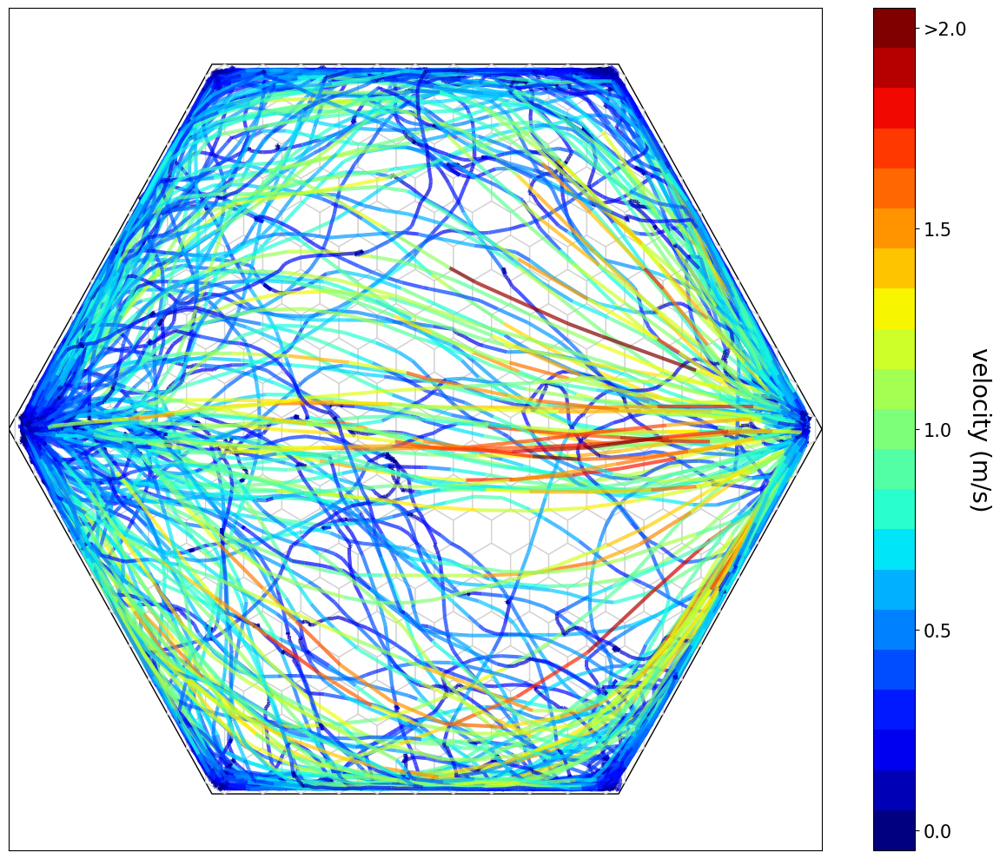

In [ ]:
# @title Panel A: No Obstacles (T)

# Common cell setup
%reset -f

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import random
from cellworld import *


experiment_files = ["control_experiments/open_field/H/iteration_01.json",
                    "control_experiments/open_field/H/iteration_02.json",
                    "control_experiments/open_field/H/iteration_03.json",
                    "control_experiments/open_field/H/iteration_04.json"]

occlusions = '00_00'
w = World.get_from_parameters_names('hexagonal',"canonical",occlusions)
d = Display(w, fig_size=(12,10), padding=0, cell_edge_color="lightgrey", background_color="white", habitat_edge_color="black")
subject_str = 'prey'
scalar = 1.0
mv = 2/2.34

for f in experiment_files[:]:
  DownloadDataFile(f)
  e = Experiment.load_from_file(DataFile(f))
  e.remove_episodes(e.get_broken_trajectory_episodes(threshold_distance = 0.13) + e.get_wrong_goal_episodes() + e.get_wrong_origin_episodes() + e.get_incomplete_episodes())
  for i, episode in enumerate(e.episodes[:]):
    t = episode.trajectories
    ht = t.get_agent_trajectory(subject_str)
    prey_ust= ht.get_unique_steps()
    pcount = 0
    if prey_ust.get_stops_steps():
      for tup in prey_ust.get_stops_steps():
        if tup[1].location.dist(Location(0,0.5)) > .1:
          # d.circle(tup[1].location, radius = 0.01, color = 'red')
          pcount += 1
    try:
      velocities = prey_ust.get_velocities()[subject_str].moving_average_filter(2)
    except:
      continue
    fil_vel = [fv for fv in prey_ust.get_filtered_velocities(complementary = .8)[subject_str]]
    nv = [ve/(mv*scalar) for ve in velocities]
    # cmap = plt.cm.jet(nv)
    d.add_trajectories(prey_ust, colors = {'prey': [plt.cm.jet(v) for v in nv]}, alphas = {'prey':0.7})

cmap = plt.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=2)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))
ticklabels = [round(num*2.34, 2) for num in np.linspace(0, mv*scalar, 5)]
ticklabels[-1] = f'>{ticklabels[-1]}'
cbar.ax.set_yticklabels(ticklabels, size = 15);
cbar.ax.set_ylabel('velocity (m/s)', size = 20, rotation= -90, labelpad=20)

<ipython-input-7-53ee105aa304>:115: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))


Text(0, 0.5, 'velocity (m/s)')

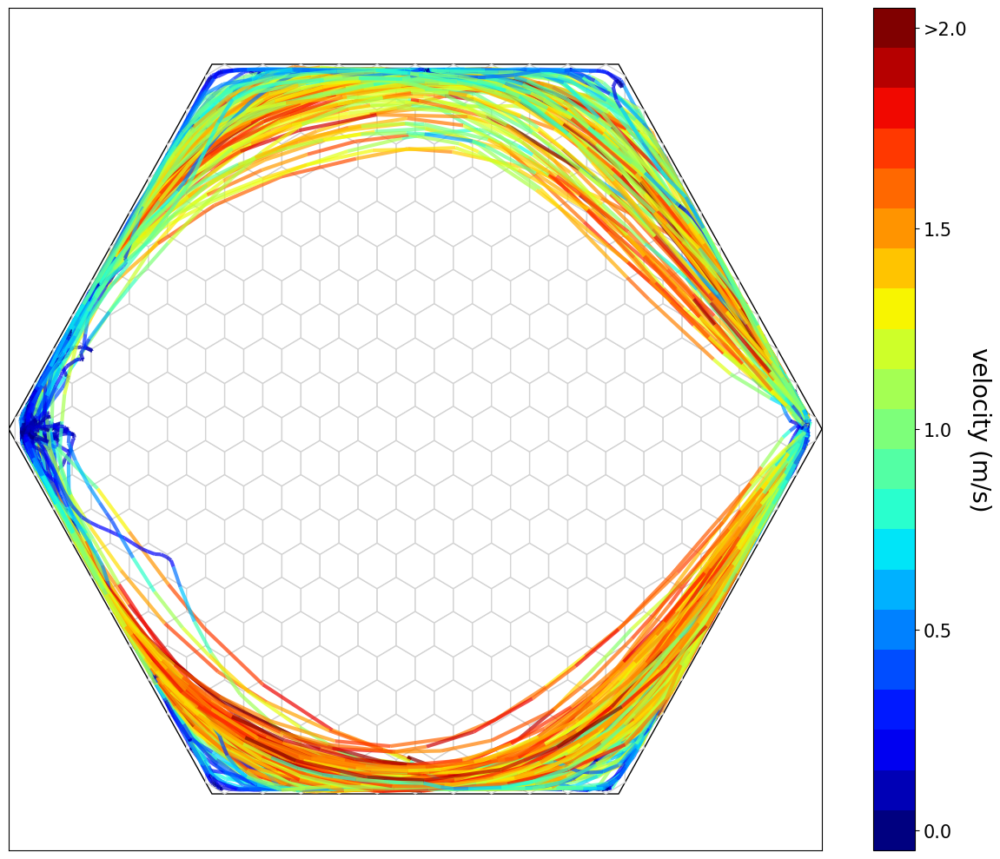

In [ ]:
# @title Pannel A: No Obstacles (R)

# Common cell setup
%reset -f

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code


import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import random
from cellworld import *

experiment_files = ["control_experiments/open_field/R/iteration_01.json",
                    "control_experiments/open_field/R/iteration_02.json",
                    "control_experiments/open_field/R/iteration_03.json",
                    "control_experiments/open_field/R/iteration_04.json",
                    "control_experiments/open_field/R/iteration_05.json",
                    "control_experiments/open_field/R/iteration_06.json",
                    "control_experiments/open_field/R/iteration_07.json"]

occlusions = '00_00'
w = World.get_from_parameters_names('hexagonal',"canonical",occlusions)
d = Display(w, fig_size=(12,10), padding=0, cell_edge_color="lightgrey", background_color="white", habitat_edge_color="black")
subject_str = 'prey'
scalar = 1.0
mv = 2/2.34

for f in experiment_files[:]:
  DownloadDataFile(f)
  e = Experiment.load_from_file(DataFile(f))
  e.remove_episodes(e.get_broken_trajectory_episodes(threshold_distance = 0.13) + e.get_wrong_goal_episodes() + e.get_wrong_origin_episodes() + e.get_incomplete_episodes())
  for i, episode in enumerate(e.episodes[:]):
    t = episode.trajectories
    ht = t.get_agent_trajectory(subject_str)
    prey_ust= ht.get_unique_steps()
    pcount = 0
    if prey_ust.get_stops_steps():
      for tup in prey_ust.get_stops_steps():
        if tup[1].location.dist(Location(0,0.5)) > .1:
          # d.circle(tup[1].location, radius = 0.01, color = 'red')
          pcount += 1
    try:
      velocities = prey_ust.get_velocities()[subject_str].moving_average_filter(2)
    except:
      continue
    fil_vel = [fv for fv in prey_ust.get_filtered_velocities(complementary = .8)[subject_str]]
    nv = [ve/(mv*scalar) for ve in velocities]
    # cmap = plt.cm.jet(nv)
    d.add_trajectories(prey_ust, colors = {'prey': [plt.cm.jet(v) for v in nv]}, alphas = {'prey':0.7})

cmap = plt.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=2)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))
ticklabels = [round(num*2.34, 2) for num in np.linspace(0, mv*scalar, 5)]
ticklabels[-1] = f'>{ticklabels[-1]}'
cbar.ax.set_yticklabels(ticklabels, size = 15);
cbar.ax.set_ylabel('velocity (m/s)', size = 20, rotation= -90, labelpad=20)

<ipython-input-8-b131574e947b>:126: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))


Text(0, 0.5, 'velocity (m/s)')

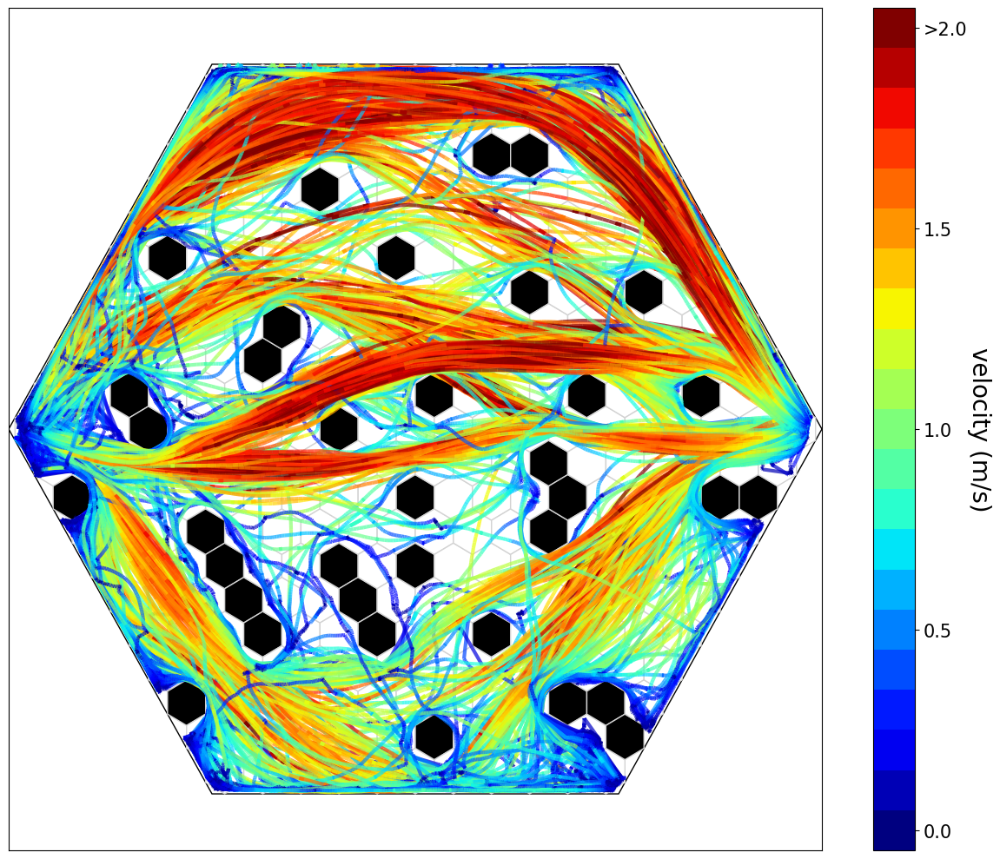

In [ ]:
# @title Panel A: Obstacles (T)

# Common cell setup
%reset -f

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code


import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import random
from cellworld import *

data_path = "experiments/HT/"

occlusions = '21_05'
w = World.get_from_parameters_names('hexagonal',"canonical",occlusions)
d = Display(w, fig_size=(12,10), padding=0, cell_edge_color="lightgrey", background_color="white", habitat_edge_color="black")
subject_str = 'prey'
scalar = 1.0
mv = 2/2.34

mice_start_iterations = {'FMM9': 8, 'FMM10': 8, 'FMM13': 6,'FMM14': 4,'MMM10': 2,'MMM11': 3,'MMM13': 5,'MMM14': 3}

for mouse, start_i in mice_start_iterations.items():
  mouse_data_path = data_path + mouse + '/'
  for j in range(3):
    iter_count = start_i + j
    iteration_data_path = mouse_data_path + 'iteration_' + str(iter_count).zfill(2) + '.hdf'
    DownloadDataFile(iteration_data_path)
    df = pd.read_hdf(DataFile(iteration_data_path))
    for e,ep in df.iloc[:].iterrows():
      if ep['bad_episode'] == 1:
        continue
      mouse = ep['mouse']
      episode = ep['ep_data'] #16,2,4,
      try:
        t = episode.trajectories
      except Exception as ex:
        print(ex)
        continue
      ht = t.get_agent_trajectory(subject_str)
      prey_ust= ht.get_unique_steps()
      try:
        velocities = prey_ust.get_velocities()[subject_str].moving_average_filter(10)
      except Exception as e:
        print(e)
        continue

      nv = [ve/(mv) for ve in velocities]
      cmap = plt.cm.jet(nv)

      x = prey_ust.get('location').get('x')
      y = prey_ust.get('location').get('y')

      x_diff = np.diff(np.array(x))
      y_diff = np.diff(np.array(y))
      if any(x_diff>.1) or any(y_diff>.1):
        continue
      else:
        d.add_trajectories(prey_ust, colors = {'prey': [plt.cm.jet(v) for v in nv]}, alphas = {'prey': 0.7})

cmap = plt.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=2)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))
ticklabels = [round(num*2.34, 2) for num in np.linspace(0, mv*scalar, 5)]
ticklabels[-1] = f'>{ticklabels[-1]}'
cbar.ax.set_yticklabels(ticklabels, size = 15);
cbar.ax.set_ylabel('velocity (m/s)', size = 20, rotation= -90, labelpad=20)

<ipython-input-9-ff59bb720914>:133: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))


Text(0, 0.5, 'velocity (m/s)')

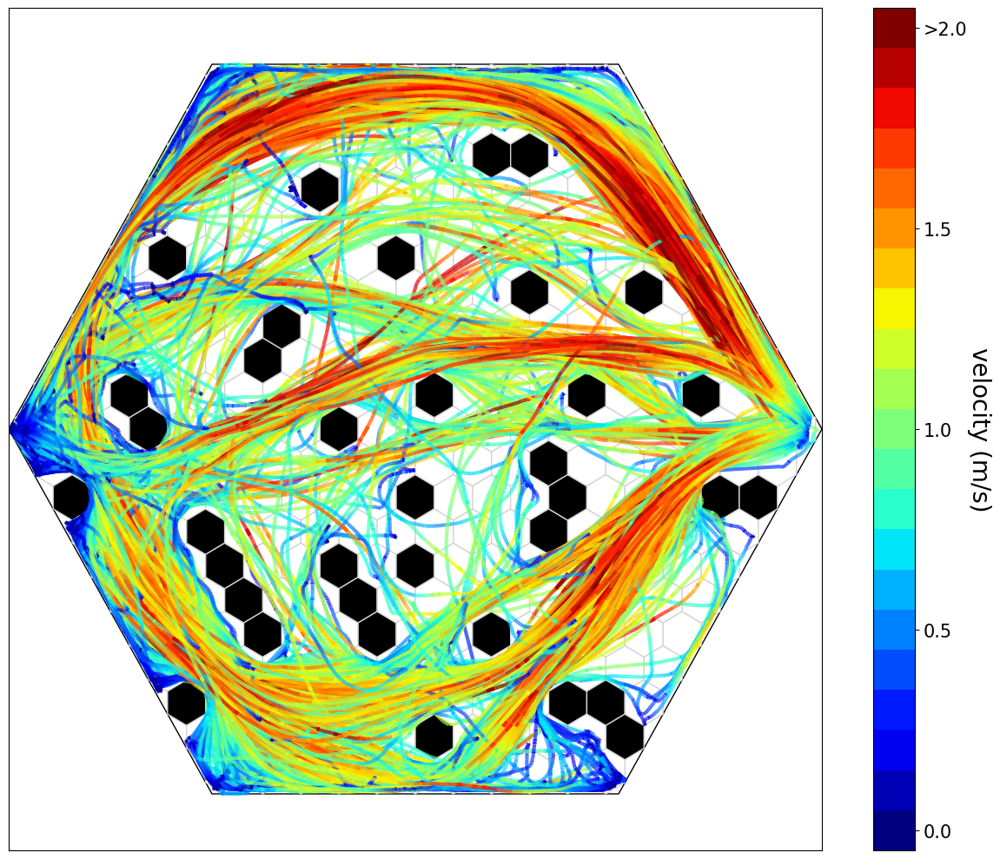

In [ ]:
# @title Panel A: Obstacles (R)

# Common cell setup
%reset -f

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import random
from cellworld import *

occlusions = '21_05'
w = World.get_from_parameters_names('hexagonal',"canonical",occlusions)
d = Display(w, fig_size=(12,10), padding=0, cell_edge_color="lightgrey", background_color="white", habitat_edge_color="black")
subject_str = 'prey'
scalar = 1.0
mv = 2/2.34

mice =['FMM9', 'FMM10', 'FMM13','FMM14','MMM10','MMM11','MMM13','MMM14']
experiment_files = []
for subject in mice:
  def filter(experiment):
    return (experiment.phase == 'RT') and (experiment.subject == subject)
  RT_experiment_files = Experiment_list.filter(key=filter)[-3:]
  experiment_files += RT_experiment_files

def filter(experiment):
  return (experiment.phase == 'R')
R_experiment_files = Experiment_list.filter(key=filter)
experiment_files += R_experiment_files

for f in experiment_files:
  DownloadDataFile(f.file)
  df = pd.read_hdf(DataFile(f.file))
  for e,ep in df.iloc[:].iterrows():
    if ep['bad_episode'] == 1:
      continue
    mouse = ep['mouse']
    episode = ep['ep_data'] #16,2,4,
    try:
      t = episode.trajectories
    except Exception as ex:
      print(ex)
      continue
    ht = t.get_agent_trajectory(subject_str)
    prey_ust= ht.get_unique_steps()
    try:
      velocities = prey_ust.get_velocities()[subject_str].moving_average_filter(10)
    except Exception as e:
      print(e)
      continue
    # fil_vel = [fv for fv in prey_ust.get_filtered_velocities(complementary = .8)[subject_str]]
    mv = 2/2.34
    nv = [ve/(mv) for ve in velocities]
    cmap = plt.cm.jet(nv)

    x = prey_ust.get('location').get('x')
    y = prey_ust.get('location').get('y')

    x_diff = np.diff(np.array(x))
    y_diff = np.diff(np.array(y))
    if any(x_diff>.1) or any(y_diff>.1):
      continue
    else:
      d.add_trajectories(prey_ust, colors = {'prey': [plt.cm.jet(v) for v in nv]}, alphas = {'prey': 0.7})

cmap = plt.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=2)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))
ticklabels = [round(num*2.34, 2) for num in np.linspace(0, mv*scalar, 5)]
ticklabels[-1] = f'>{ticklabels[-1]}'
cbar.ax.set_yticklabels(ticklabels, size = 15);
cbar.ax.set_ylabel('velocity (m/s)', size = 20, rotation= -90, labelpad=20)

<ipython-input-10-eb13dccb8865>:124: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))


Text(0, 0.5, 'velocity (m/s)')

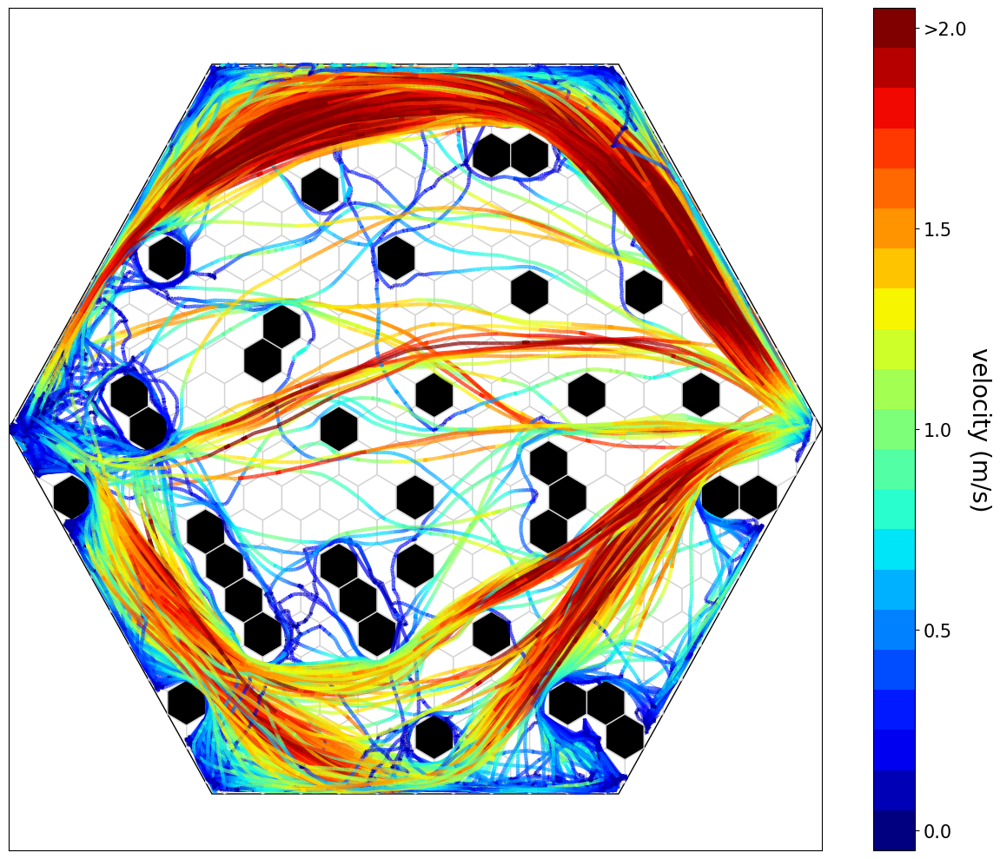

In [ ]:
# @title Panel A: Obstacles (PR)

# Common cell setup
%reset -f

!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import random
from cellworld import *

occlusions = '21_05'
w = World.get_from_parameters_names('hexagonal',"canonical",occlusions)
d = Display(w, fig_size=(12,10), padding=0, cell_edge_color="lightgrey", background_color="white", habitat_edge_color="black")
subject_str = 'prey'
scalar = 1.0
mv = 2/2.34

def filter(experiment):
  return (experiment.phase == 'H')
experiment_files = Experiment_list.filter(key=filter)

for f in experiment_files:
  DownloadDataFile(f.file)
  df = pd.read_hdf(DataFile(f.file))
  for e,ep in df.iloc[:].iterrows():
    if ep['bad_episode'] == 1:
      continue
    mouse = ep['mouse']
    episode = ep['ep_data'] #16,2,4,
    try:
      t = episode.trajectories
    except Exception as ex:
      print(ex)
      continue
    ht = t.get_agent_trajectory(subject_str)
    prey_ust= ht.get_unique_steps()
    try:
      velocities = prey_ust.get_velocities()[subject_str].moving_average_filter(10)
    except Exception as e:
      print(e)
      continue
    # fil_vel = [fv for fv in prey_ust.get_filtered_velocities(complementary = .8)[subject_str]]
    mv = 2/2.34
    nv = [ve/(mv) for ve in velocities]
    cmap = plt.cm.jet(nv)

    x = prey_ust.get('location').get('x')
    y = prey_ust.get('location').get('y')

    x_diff = np.diff(np.array(x))
    y_diff = np.diff(np.array(y))
    if any(x_diff>.1) or any(y_diff>.1):
      continue
    else:
      d.add_trajectories(prey_ust, colors = {'prey': [plt.cm.jet(v) for v in nv]}, alphas = {'prey': 0.7})

cmap = plt.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=2)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks=np.linspace(0, 2, 5), boundaries=np.arange(-0.05, 2.1, .1))
ticklabels = [round(num*2.34, 2) for num in np.linspace(0, mv*scalar, 5)]
ticklabels[-1] = f'>{ticklabels[-1]}'
cbar.ax.set_yticklabels(ticklabels, size = 15);
cbar.ax.set_ylabel('velocity (m/s)', size = 20, rotation= -90, labelpad=20)

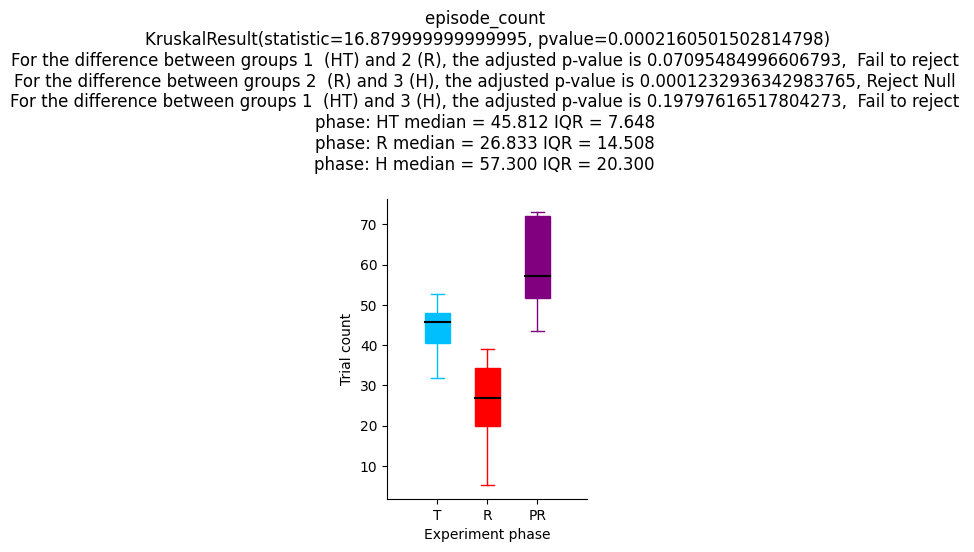

In [ ]:
# @title Panel B:Trial Count per Phase

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statistics
from scipy import stats
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as sp
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from statistics import mean

class Figure6_PanelB:
    def __init__(self, df, dependent_variable, hist = False):

        self.df = df
        self.dependent_variable = dependent_variable
        self.order = ['HT', 'R', 'H']                   # for parsing data so need "og" suffixes
        if hist:
            data = [df.loc[df["suffix3"] == s, dependent_variable].to_list() for s in self.order]
            self.N = [len(d) for d in data]
            self.data = [sum(d, []) for d in data]
        else:
            self.data = [self.df.loc[self.df["suffix3"] == s].loc[:,self.dependent_variable].to_list() for s in self.order]


        self.colors = ["deepskyblue","red",  "purple"]
        self.labels = ['AT', 'R', 'A']


    def create_boxplot(self, x_label, y_label, log_scale = False, outliers = True, figsize =(2, 3)):

        fig = plt.figure(figsize = figsize, facecolor=(1, 1, 1))
        ax = fig.add_axes([0, 0, 1, 1])

        # Creating plot
        bp = ax.boxplot(self.data, showfliers = outliers, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4, .6], widths = 0.1) # showmeans=True

        # edit boxplot appearance
        for patch, color in zip(bp['boxes'], self.colors):
            patch.set_facecolor(color)
            patch.set(color = color)

        color_index = 0
        for i, w in enumerate(bp['whiskers']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        color_index = 0
        for i, w in enumerate(bp['caps']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        outlier_alpha = 0.3
        for flier in bp['fliers']:
            flier.set(alpha=outlier_alpha)

        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_xlim(0,.8)

        if log_scale:
            ax.set_yticks(np.arange(0, 4))
            ax.set_yticklabels(10**np.arange(0, 4))

        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)


        return fig, ax

    def get_statisitics(self):
        sig_level = 0.05

        # Kruskal-Wallis H-test
        h , p = stats.kruskal(*self.data)

        # Dunn's Test
        p_values = sp.posthoc_dunn(self.data, p_adjust= 'bonferroni')  # format data properly

        a = str(stats.kruskal(*self.data)) + "\n"
        b = f'For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"} \n'
        c = f'For the difference between groups 2  (R) and 3 (H), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"} \n'
        d = f'For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"} \n'

        return f"{a}{b}{c}{d}"
        # check if p_values are higher than the level of significance false represents that two groups are statistically significant or that the null hypothesis is rejected


    def get_sum_stats(self):

        stats_df = self.df[["suffix3", self.dependent_variable]]
        sum_stats =  stats_df.groupby(['suffix3'], as_index=True).describe()
        sum_stats.columns = ['count', 'mean', 'std', 'min', 'Q1', 'median', 'Q3', 'max']
        sum_stats = sum_stats.loc[self.order].reset_index()
        sum_stats['IQR'] = sum_stats['Q3'] - sum_stats['Q1']

        sum_stats_str = ""
        for i in self.order:
            result = sum_stats.loc[sum_stats["suffix3"] == i]
            median = float(result['median'])
            IQR = float(result['IQR'])
            sum_stats_str += f"phase: {i} median = {median:.3f} IQR = {IQR:.3f} \n"

        return sum_stats_str

    def get_plot_title(self):
        return f"{self.dependent_variable} \n" + self.get_statisitics() + self.get_sum_stats()

    def create_histogram(self, x_min = 2, x_max = 10, num_bins = 25 ,y_max = .2,figsize=(10, 10), normalize = False):
        fig, axs = plt.subplots(1, 1, figsize = figsize)
        bin_num = np.linspace(x_min, x_max, num_bins )

        for i in range(3):
            n, bins, patches = axs.hist(self.data[i], bins = bin_num, color = self.colors[i], density = normalize, alpha = 0.2, edgecolor= self.colors[i]) # Create a histogram
            n_normalized = np.divide(n, self.N[i])                  # Divide the bin heights by the epsidoe count

            for patch, height in zip(patches, n_normalized):  # Update the heights of the histogram bars with the normalized values
                patch.set_height(height)

            bin_centers = (bins[:-1] + bins[1:]) / 2   # Calculate the bin centers
            plt.plot(bin_centers, n_normalized, color = self.colors[i], linewidth=1.5, label = self.labels[i])   # Connect the heights with a line

        axs.set_xlim([0, x_max])
        axs.set_ylim([0, y_max])
        plt.tight_layout()
        fig.text(0.5, 0.01, 'Pause time (seconds)', ha='center')
        fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical')
        legend = axs.legend(loc='upper right', bbox_to_anchor=(1, 1))
        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)

        return fig, axs

DownloadDataFile("df.pkl")

df = pd.read_pickle(DataFile("df.pkl"))

df['prey_trajectory_length_cm'] = df['prey_trajectory_length_canonical'] * 2.34 * 100    # convert trajectory length from canonical to cm
df.mouse = [i[3] for i in df.experiment.str.split('_')]

grb = ["mouse" , "suffix3"]
dependent_variable = 'prey_trajectory_length_cm'

# find the average trajectory length for each subject in each phase
group_df = df.groupby(grb, as_index=False).agg({dependent_variable:['mean']})
group_df.columns = grb + [dependent_variable]

grb = ["mouse" , "suffix3"]
dependent_variable = 'episode_count'

# create df with a row for each experiment and column with number of episodes in that experiment
group_df = df.groupby(["experiment", 'suffix3', 'mouse']).size()  # also ep count
group_df = group_df.reset_index()
group_df.columns = ['experiment', 'suffix3','mouse',dependent_variable]
# find the average episode count for each subject in each phase
group_df = group_df.groupby(grb, as_index=False).agg({dependent_variable:['mean']})
group_df.columns = grb + [dependent_variable]


# label axes
x_label = 'Experiment phase'
y_label = 'Trial count'

# create PhaseStatistics object
ep_count_object = Figure6_PanelB(group_df, dependent_variable)


# plot
title = ep_count_object.get_plot_title()
fig, ax = ep_count_object.create_boxplot(x_label, y_label, False, True)
# ax.text(2, 10, 'Editable Text', fontsize=12, color='black')


ax.set_xticklabels(["T", "R", "PR"])
ax.set_title(title)
plt.show()

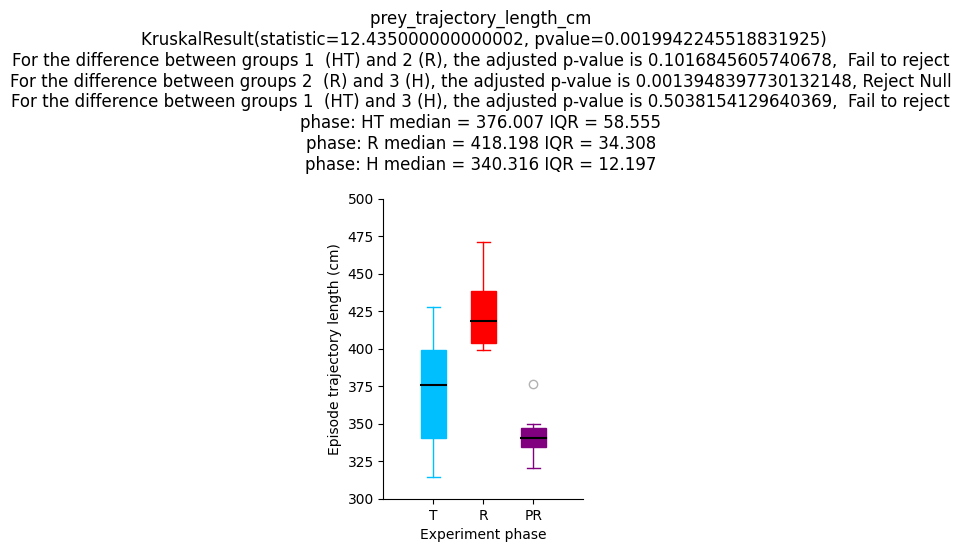

In [ ]:
# @title Panel C: Trajectories Length per Phase

# Common cell setup
%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statistics
from scipy import stats
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as sp
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from statistics import mean

class Figure6_PanelC:
    def __init__(self, df, dependent_variable, hist = False):

        self.df = df
        self.dependent_variable = dependent_variable
        self.order = ['HT', 'R', 'H']                   # for parsing data so need "og" suffixes
        if hist:
            data = [df.loc[df["suffix3"] == s, dependent_variable].to_list() for s in self.order]
            self.N = [len(d) for d in data]
            self.data = [sum(d, []) for d in data]
        else:
            self.data = [self.df.loc[self.df["suffix3"] == s].loc[:,self.dependent_variable].to_list() for s in self.order]


        self.colors = ["deepskyblue","red",  "purple"]
        self.labels = ['AT', 'R', 'A']


    def create_boxplot(self, x_label, y_label, log_scale = False, outliers = True, figsize =(2, 3)):

        fig = plt.figure(figsize = figsize, facecolor=(1, 1, 1))
        ax = fig.add_axes([0, 0, 1, 1])

        # Creating plot
        bp = ax.boxplot(self.data, showfliers = outliers, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4, .6], widths = 0.1) # showmeans=True

        # edit boxplot appearance
        for patch, color in zip(bp['boxes'], self.colors):
            patch.set_facecolor(color)
            patch.set(color = color)

        color_index = 0
        for i, w in enumerate(bp['whiskers']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        color_index = 0
        for i, w in enumerate(bp['caps']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        outlier_alpha = 0.3
        for flier in bp['fliers']:
            flier.set(alpha=outlier_alpha)

        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_xlim(0,.8)

        if log_scale:
            ax.set_yticks(np.arange(0, 4))
            ax.set_yticklabels(10**np.arange(0, 4))

        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)


        return fig, ax

    def get_statisitics(self):
        sig_level = 0.05

        # Kruskal-Wallis H-test
        h , p = stats.kruskal(*self.data)

        # Dunn's Test
        p_values = sp.posthoc_dunn(self.data, p_adjust= 'bonferroni')  # format data properly

        a = str(stats.kruskal(*self.data)) + "\n"
        b = f'For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"} \n'
        c = f'For the difference between groups 2  (R) and 3 (H), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"} \n'
        d = f'For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"} \n'

        return f"{a}{b}{c}{d}"
        # check if p_values are higher than the level of significance false represents that two groups are statistically significant or that the null hypothesis is rejected


    def get_sum_stats(self):

        stats_df = self.df[["suffix3", self.dependent_variable]]
        sum_stats =  stats_df.groupby(['suffix3'], as_index=True).describe()
        sum_stats.columns = ['count', 'mean', 'std', 'min', 'Q1', 'median', 'Q3', 'max']
        sum_stats = sum_stats.loc[self.order].reset_index()
        sum_stats['IQR'] = sum_stats['Q3'] - sum_stats['Q1']

        sum_stats_str = ""
        for i in self.order:
            result = sum_stats.loc[sum_stats["suffix3"] == i]
            median = float(result['median'])
            IQR = float(result['IQR'])
            sum_stats_str += f"phase: {i} median = {median:.3f} IQR = {IQR:.3f} \n"

        return sum_stats_str

    def get_plot_title(self):
        return f"{self.dependent_variable} \n" + self.get_statisitics() + self.get_sum_stats()

    def create_histogram(self, x_min = 2, x_max = 10, num_bins = 25 ,y_max = .2,figsize=(10, 10), normalize = False):
        fig, axs = plt.subplots(1, 1, figsize = figsize)
        bin_num = np.linspace(x_min, x_max, num_bins )

        for i in range(3):
            n, bins, patches = axs.hist(self.data[i], bins = bin_num, color = self.colors[i], density = normalize, alpha = 0.2, edgecolor= self.colors[i]) # Create a histogram
            n_normalized = np.divide(n, self.N[i])                  # Divide the bin heights by the epsidoe count

            for patch, height in zip(patches, n_normalized):  # Update the heights of the histogram bars with the normalized values
                patch.set_height(height)

            bin_centers = (bins[:-1] + bins[1:]) / 2   # Calculate the bin centers
            plt.plot(bin_centers, n_normalized, color = self.colors[i], linewidth=1.5, label = self.labels[i])   # Connect the heights with a line

        axs.set_xlim([0, x_max])
        axs.set_ylim([0, y_max])
        plt.tight_layout()
        fig.text(0.5, 0.01, 'Pause time (seconds)', ha='center')
        fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical')
        legend = axs.legend(loc='upper right', bbox_to_anchor=(1, 1))
        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)

        return fig, axs

DownloadDataFile("df.pkl")

df = pd.read_pickle(DataFile("df.pkl"))

df['prey_trajectory_length_cm'] = df['prey_trajectory_length_canonical'] * 2.34 * 100    # convert trajectory length from canonical to cm
df.mouse = [i[3] for i in df.experiment.str.split('_')]

grb = ["mouse" , "suffix3"]
dependent_variable = 'prey_trajectory_length_cm'

# find the average trajectory length for each subject in each phase
group_df = df.groupby(grb, as_index=False).agg({dependent_variable:['mean']})
group_df.columns = grb + [dependent_variable]

# label axes
x_label = 'Experiment phase'
y_label = 'Episode trajectory length (cm)'

# create PhaseStatistics object
traj_length_obj = Figure6_PanelC(group_df, dependent_variable)

# plot
title = traj_length_obj.get_plot_title()
fig, ax = traj_length_obj.create_boxplot(x_label, y_label, False, True)

ax.set_ylim([300,500])
ax.set_xticklabels(["T", "R", "PR"])
ax.set_title(title)
plt.show()

plt.rcParams["pdf.use14corefonts"] = True
# fig.savefig(f"CodeFigures/{dependent_variable}.pdf",  dpi=300, bbox_inches='tight')



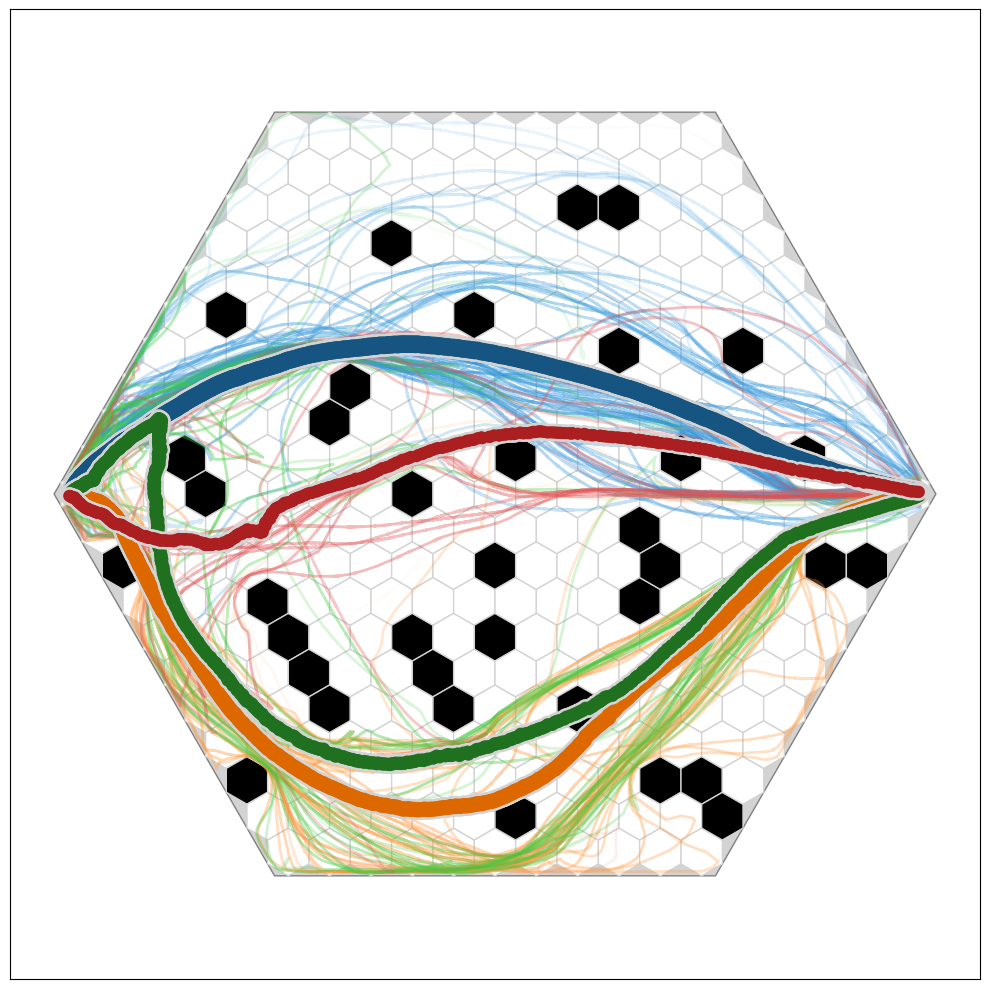

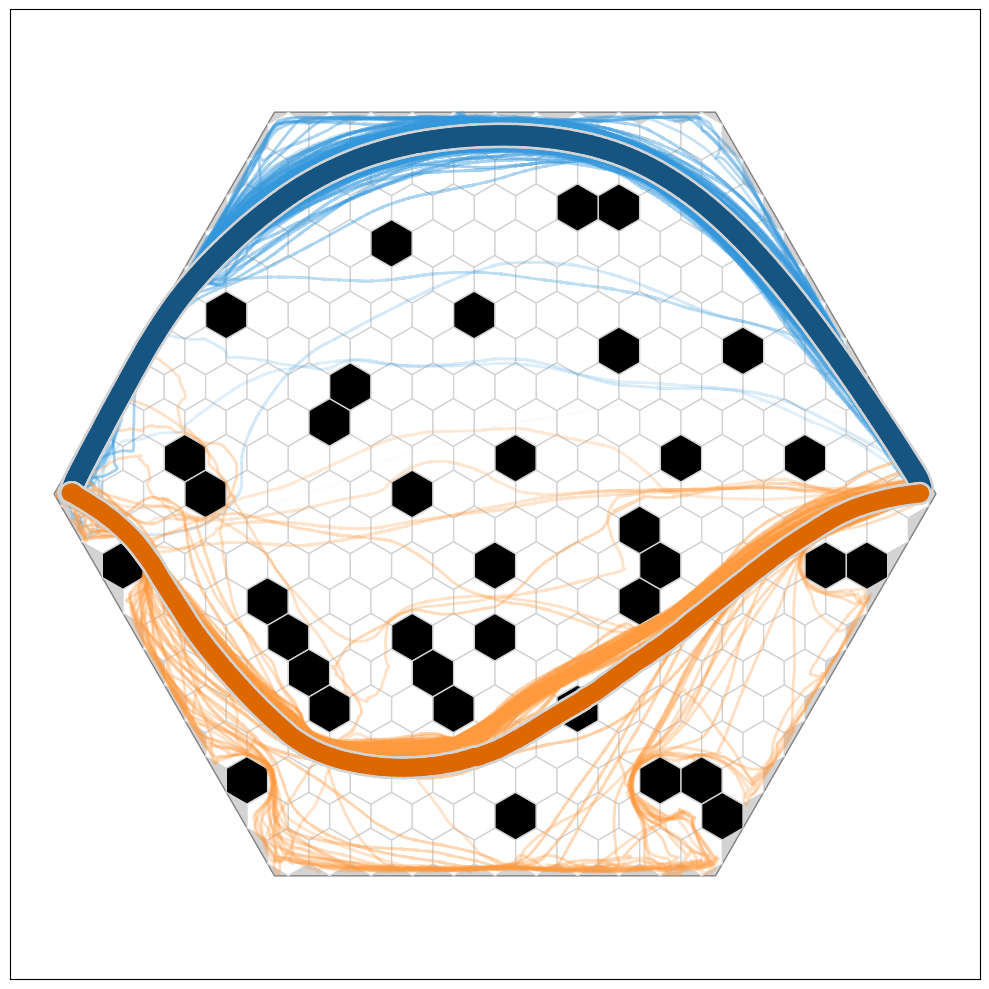

In [ ]:
# @title Panel D: Example Cluster

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pickle
import warnings
from cellworld import *
import pandas as pd


warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
pickle.HIGHEST_PROTOCOL = 4

def load(experiment_files: list):
    clusters = StreamLineClusters(max_distance=.15, streamline_len=500)

    episodes = Episode_list()
    for experiment_file in experiment_files:
        DownloadDataFile(experiment_file)
        e = pd.read_hdf(DataFile(experiment_file))
        for k, ep in e.iloc[:].iterrows():
            if ep['bad_episode'] == 1:
                continue
            episode = ep['ep_data']
            episodes.append(episode)

    for episode in episodes:
        prey_trajectory = episode.trajectories.get_agent_trajectory("prey")
        if prey_trajectory:
            clusters.add_trajectory(prey_trajectory)
    return clusters

w = World.get_from_parameters_names("hexagonal", "canonical", "21_05")

experiment_files = ["experiments/R/FMM14/iteration_01.hdf",
                    "experiments/R/FMM14/iteration_02.hdf",
                    "experiments/R/FMM14/iteration_03.hdf",
                    "experiments/RT/FMM14/iteration_01.hdf",
                    "experiments/RT/FMM14/iteration_02.hdf",
                    "experiments/RT/FMM14/iteration_03.hdf",
                    "experiments/RT/FMM14/iteration_04.hdf"]

clusters = load(experiment_files)
clusters.filter_clusters(clusters.streamline_count() * .05)
clusters.assign_unclustered()
colors = list(mcolors.TABLEAU_COLORS.keys())
d = Display(w, fig_size=(10, 10), occlusion_color="black", cell_edge_color="lightgray",
            habitat_color="lightgray", habitat_edge_color="gray")
d.plot_clusters(clusters, colors=colors, show_centroids=True, use_alpha=True)
plt.show()


experiment_files = ["experiments/H/MMM13/iteration_01.hdf",
                    "experiments/H/MMM13/iteration_02.hdf",
                    "experiments/H/MMM13/iteration_03.hdf",
                    "experiments/H/MMM13/iteration_04.hdf",
                    "experiments/H/MMM13/iteration_05.hdf"]

clusters = load(experiment_files)
clusters.filter_clusters(clusters.streamline_count() * .05)
clusters.assign_unclustered()
colors = list(mcolors.TABLEAU_COLORS.keys())
d = Display(w, fig_size=(10, 10), occlusion_color="black", cell_edge_color="lightgray",
            habitat_color="lightgray", habitat_edge_color="gray")
d.plot_clusters(clusters, colors=colors, show_centroids=True, use_alpha=True)
plt.show()




KruskalResult(statistic=15.539256198347111, pvalue=0.0004223703174737582)
For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is 0.3061832652735918,  Fail to reject
For the difference between groups 2  (R) and 3 (H), the adjusted p-value is 0.0002614218229161336, Reject Null
For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is 0.06625207432289683,  Fail to reject


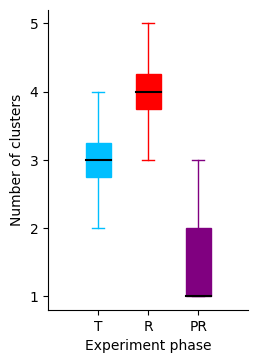

In [ ]:
# @title Panel E: Number of Cluster per Phase

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import matplotlib.pyplot as plt
import json
import numpy as np
import scipy as sp
from statistics import median
import pandas as pd
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as scp


DownloadDataFile('figures/fig_6/cluster_results.hdf')
cluster_results_df = pd.read_hdf(DataFile('figures/fig_6/cluster_results.hdf')).T

num_clus = []
for phase,row in cluster_results_df.iterrows():
  num_clus.append(row['num_clus'])
  pmedian = median(row['num_clus'])
  iqr = sp.stats.iqr(row['num_clus'])

# create boxplot
fig = plt.figure(figsize =(2, 3), facecolor=(1, 1, 1))

# Creating axes instance
ax = fig.add_axes([0, 0, 1, 1])

# Creating plot    - plotting this on a log scale
bp = ax.boxplot(num_clus, showfliers = True, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4, .6], widths = 0.1) # showmeans=True
ax.set_xticklabels(['T', 'R', 'PR'])

# edit boxplot appearance
colors = ["deepskyblue","red",  "purple"]
for patch, color in zip(bp['boxes'], colors):
  patch.set_facecolor(color)
  patch.set(color = color)

color_index = 0
for i, w in enumerate(bp['whiskers']):
  w.set(color = colors[color_index])
  if i % 2 != 0:
    color_index += 1

color_index = 0
for i, w in enumerate(bp['caps']):
  w.set(color = colors[color_index])
  if i % 2 != 0:
    color_index += 1

outlier_alpha = 0.3
for flier in bp['fliers']:
  flier.set(alpha=outlier_alpha)


# show plot
ax.set_xlabel('Experiment phase')
ax.set_ylabel('Number of clusters')
ax.set_xlim(0,.8)
ax.set_yticks(np.arange(1, 6))
# ax.set_yticklabels(10**np.arange(0, 4))


for pos in ['top', 'right']:
    plt.gca().spines[pos].set_visible(False)

base_output = '/content/drive/MyDrive/MacIver Lab: Habitat/hab_methods/code/CodeFigures/'
fig.show()

#SHOW STATS
sig_level = 0.05
data = num_clus

# Kruskal-Wallis H-test
print(kruskal(*data))
h , p = kruskal(*data)

# Dunn's Test
p_values = scp.posthoc_dunn(data, p_adjust= 'bonferroni')  # format data properly

print(f'For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"}')
print(f'For the difference between groups 2  (R) and 3 (H), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"}')
print(f'For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"}')

KruskalResult(statistic=18.015, pvalue=0.00012248769279576293)
For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is 0.13163402367124127,  Fail to reject
For the difference between groups 2  (R) and 3 (H), the adjusted p-value is 6.627149099575633e-05, Reject Null
For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is 0.07776438955971089,  Fail to reject


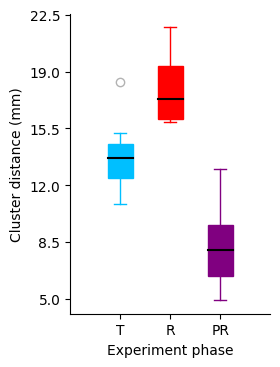

In [ ]:
#@title Panel F: Average distance from closest cluster

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code

import matplotlib.pyplot as plt
import json
import numpy as np
import scipy as sp
from statistics import median
import pandas as pd
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as scp


DownloadDataFile('figures/fig_6/cluster_results.hdf')
cluster_results_df = pd.read_hdf(DataFile('figures/fig_6/cluster_results.hdf')).T


data = []
for phase,row in cluster_results_df.iterrows():
  data.append(row['average_clus_dist'])
  pmedian = median(row['average_clus_dist'])
  iqr = sp.stats.iqr(row['average_clus_dist'])

# create boxplot
fig = plt.figure(figsize =(2, 3), facecolor=(1, 1, 1))

# Creating axes instance
ax = fig.add_axes([0, 0, 1, 1])

# Creating plot    - plotting this on a log scale
bp = ax.boxplot(data, showfliers = True, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4, .6], widths = 0.1) # showmeans=True
ax.set_xticklabels(['T', 'R', 'PR'])

# edit boxplot appearance
colors = ["deepskyblue","red",  "purple"]
for patch, color in zip(bp['boxes'], colors):
  patch.set_facecolor(color)
  patch.set(color = color)

color_index = 0
for i, w in enumerate(bp['whiskers']):
  w.set(color = colors[color_index])
  if i % 2 != 0:
    color_index += 1

color_index = 0
for i, w in enumerate(bp['caps']):
  w.set(color = colors[color_index])
  if i % 2 != 0:
    color_index += 1

outlier_alpha = 0.3
for flier in bp['fliers']:
  flier.set(alpha=outlier_alpha)


# show plot
ax.set_xlabel('Experiment phase')
ax.set_ylabel('Cluster distance (mm)')
ax.set_xlim(0,.8)
ax.set_yticks(np.linspace(50, 225, 6))
ax.set_yticklabels(np.linspace(50, 225, 6)/10)


for pos in ['top', 'right']:
    plt.gca().spines[pos].set_visible(False)

base_output = '/content/drive/MyDrive/MacIver Lab: Habitat/hab_methods/code/CodeFigures/'
fig.show()

#SHOW STATS
sig_level = 0.05

# Kruskal-Wallis H-test
print(kruskal(*data))
h , p = kruskal(*data)

# Dunn's Test
p_values = scp.posthoc_dunn(data, p_adjust= 'bonferroni')  # format data properly

print(f'For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"}')
print(f'For the difference between groups 2  (R) and 3 (H), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"}')
print(f'For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"}')

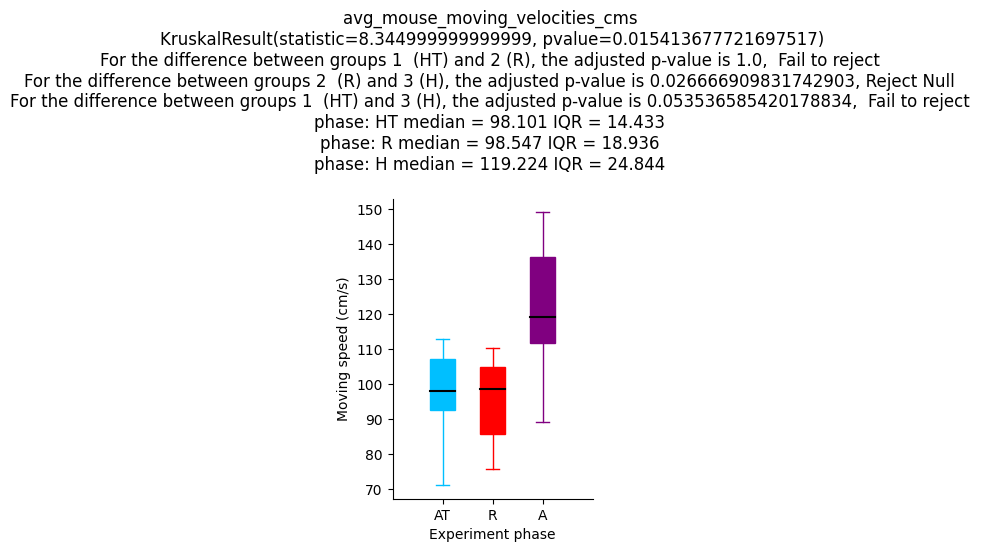

In [ ]:
# @title Panel G: Moving Speed per Phase

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code

import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statistics
from scipy import stats
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as sp
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from statistics import mean

class Figure6_PanelG:
    def __init__(self, df, dependent_variable, hist = False):

        self.df = df
        self.dependent_variable = dependent_variable
        self.order = ['HT', 'R', 'H']                   # for parsing data so need "og" suffixes
        if hist:
            data = [df.loc[df["suffix3"] == s, dependent_variable].to_list() for s in self.order]
            self.N = [len(d) for d in data]
            self.data = [sum(d, []) for d in data]
        else:
            self.data = [self.df.loc[self.df["suffix3"] == s].loc[:,self.dependent_variable].to_list() for s in self.order]


        self.colors = ["deepskyblue","red",  "purple"]
        self.labels = ['AT', 'R', 'A']


    def create_boxplot(self, x_label, y_label, log_scale = False, outliers = True, figsize =(2, 3)):

        fig = plt.figure(figsize = figsize, facecolor=(1, 1, 1))
        ax = fig.add_axes([0, 0, 1, 1])

        # Creating plot
        bp = ax.boxplot(self.data, showfliers = outliers, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4, .6], widths = 0.1) # showmeans=True

        # edit boxplot appearance
        for patch, color in zip(bp['boxes'], self.colors):
            patch.set_facecolor(color)
            patch.set(color = color)

        color_index = 0
        for i, w in enumerate(bp['whiskers']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        color_index = 0
        for i, w in enumerate(bp['caps']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        outlier_alpha = 0.3
        for flier in bp['fliers']:
            flier.set(alpha=outlier_alpha)

        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_xlim(0,.8)

        if log_scale:
            ax.set_yticks(np.arange(0, 4))
            ax.set_yticklabels(10**np.arange(0, 4))

        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)


        return fig, ax

    def get_statisitics(self):
        sig_level = 0.05

        # Kruskal-Wallis H-test
        h , p = stats.kruskal(*self.data)

        # Dunn's Test
        p_values = sp.posthoc_dunn(self.data, p_adjust= 'bonferroni')  # format data properly

        a = str(stats.kruskal(*self.data)) + "\n"
        b = f'For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"} \n'
        c = f'For the difference between groups 2  (R) and 3 (H), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"} \n'
        d = f'For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"} \n'

        return f"{a}{b}{c}{d}"
        # check if p_values are higher than the level of significance false represents that two groups are statistically significant or that the null hypothesis is rejected


    def get_sum_stats(self):

        stats_df = self.df[["suffix3", self.dependent_variable]]
        sum_stats =  stats_df.groupby(['suffix3'], as_index=True).describe()
        sum_stats.columns = ['count', 'mean', 'std', 'min', 'Q1', 'median', 'Q3', 'max']
        sum_stats = sum_stats.loc[self.order].reset_index()
        sum_stats['IQR'] = sum_stats['Q3'] - sum_stats['Q1']

        sum_stats_str = ""
        for i in self.order:
            result = sum_stats.loc[sum_stats["suffix3"] == i]
            median = float(result['median'])
            IQR = float(result['IQR'])
            sum_stats_str += f"phase: {i} median = {median:.3f} IQR = {IQR:.3f} \n"

        return sum_stats_str

    def get_plot_title(self):
        return f"{self.dependent_variable} \n" + self.get_statisitics() + self.get_sum_stats()

    def create_histogram(self, x_min = 2, x_max = 10, num_bins = 25 ,y_max = .2,figsize=(10, 10), normalize = False):
        fig, axs = plt.subplots(1, 1, figsize = figsize)
        bin_num = np.linspace(x_min, x_max, num_bins )

        for i in range(3):
            n, bins, patches = axs.hist(self.data[i], bins = bin_num, color = self.colors[i], density = normalize, alpha = 0.2, edgecolor= self.colors[i]) # Create a histogram
            n_normalized = np.divide(n, self.N[i])                  # Divide the bin heights by the epsidoe count

            for patch, height in zip(patches, n_normalized):  # Update the heights of the histogram bars with the normalized values
                patch.set_height(height)

            bin_centers = (bins[:-1] + bins[1:]) / 2   # Calculate the bin centers
            plt.plot(bin_centers, n_normalized, color = self.colors[i], linewidth=1.5, label = self.labels[i])   # Connect the heights with a line

        axs.set_xlim([0, x_max])
        axs.set_ylim([0, y_max])
        plt.tight_layout()
        fig.text(0.5, 0.01, 'Pause time (seconds)', ha='center')
        fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical')
        legend = axs.legend(loc='upper right', bbox_to_anchor=(1, 1))
        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)

        return fig, axs

DownloadDataFile("df.pkl")

df = pd.read_pickle(DataFile("df.pkl"))

df['prey_trajectory_length_cm'] = df['prey_trajectory_length_canonical'] * 2.34 * 100    # convert trajectory length from canonical to cm
df.mouse = [i[3] for i in df.experiment.str.split('_')]

grb = ["mouse" , "suffix3"]
dependent_variable = 'prey_trajectory_length_cm'

# find the average trajectory length for each subject in each phase
group_df = df.groupby(grb, as_index=False).agg({dependent_variable:['mean']})
group_df.columns = grb + [dependent_variable]

grb = ["mouse" , "suffix3"]
dependent_variable = 'avg_mouse_moving_velocities_cms'

# find the average trajectory length for each subject in each phase
group_df = df.groupby(grb, as_index=False).agg({dependent_variable:['mean']})
group_df.columns = grb + [dependent_variable]

# label axes
x_label = 'Experiment phase'
y_label = 'Moving speed (cm/s)'

# create PhaseStatistics object
traj_length_obj = Figure6_PanelG(group_df, dependent_variable)


# plot
title = traj_length_obj.get_plot_title()
fig, ax = traj_length_obj.create_boxplot(x_label, y_label, False, True)


ax.set_xticklabels(["AT", "R", "A"])
ax.set_title(title)
plt.show()

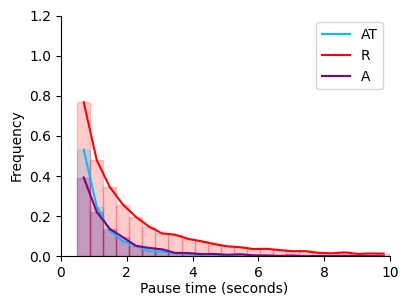

In [ ]:
# @title Panel H: Pause Duration Distribution at the Entrance

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statistics
from scipy import stats
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as sp
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from statistics import mean

class Figure6_PanelH:
    def __init__(self, df, dependent_variable, hist = False):

        self.df = df
        self.dependent_variable = dependent_variable
        self.order = ['HT', 'R', 'H']                   # for parsing data so need "og" suffixes
        if hist:
            data = [df.loc[df["suffix3"] == s, dependent_variable].to_list() for s in self.order]
            self.N = [len(d) for d in data]
            self.data = [sum(d, []) for d in data]
        else:
            self.data = [self.df.loc[self.df["suffix3"] == s].loc[:,self.dependent_variable].to_list() for s in self.order]


        self.colors = ["deepskyblue","red",  "purple"]
        self.labels = ['AT', 'R', 'A']


    def create_boxplot(self, x_label, y_label, log_scale = False, outliers = True, figsize =(2, 3)):

        fig = plt.figure(figsize = figsize, facecolor=(1, 1, 1))
        ax = fig.add_axes([0, 0, 1, 1])

        # Creating plot
        bp = ax.boxplot(self.data, showfliers = outliers, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4, .6], widths = 0.1) # showmeans=True

        # edit boxplot appearance
        for patch, color in zip(bp['boxes'], self.colors):
            patch.set_facecolor(color)
            patch.set(color = color)

        color_index = 0
        for i, w in enumerate(bp['whiskers']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        color_index = 0
        for i, w in enumerate(bp['caps']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        outlier_alpha = 0.3
        for flier in bp['fliers']:
            flier.set(alpha=outlier_alpha)

        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_xlim(0,.8)

        if log_scale:
            ax.set_yticks(np.arange(0, 4))
            ax.set_yticklabels(10**np.arange(0, 4))

        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)


        return fig, ax

    def get_statisitics(self):
        sig_level = 0.05

        # Kruskal-Wallis H-test
        h , p = stats.kruskal(*self.data)

        # Dunn's Test
        p_values = sp.posthoc_dunn(self.data, p_adjust= 'bonferroni')  # format data properly

        a = str(stats.kruskal(*self.data)) + "\n"
        b = f'For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"} \n'
        c = f'For the difference between groups 2  (R) and 3 (H), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"} \n'
        d = f'For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"} \n'

        return f"{a}{b}{c}{d}"
        # check if p_values are higher than the level of significance false represents that two groups are statistically significant or that the null hypothesis is rejected


    def get_sum_stats(self):

        stats_df = self.df[["suffix3", self.dependent_variable]]
        sum_stats =  stats_df.groupby(['suffix3'], as_index=True).describe()
        sum_stats.columns = ['count', 'mean', 'std', 'min', 'Q1', 'median', 'Q3', 'max']
        sum_stats = sum_stats.loc[self.order].reset_index()
        sum_stats['IQR'] = sum_stats['Q3'] - sum_stats['Q1']

        sum_stats_str = ""
        for i in self.order:
            result = sum_stats.loc[sum_stats["suffix3"] == i]
            median = float(result['median'])
            IQR = float(result['IQR'])
            sum_stats_str += f"phase: {i} median = {median:.3f} IQR = {IQR:.3f} \n"

        return sum_stats_str

    def get_plot_title(self):
        return f"{self.dependent_variable} \n" + self.get_statisitics() + self.get_sum_stats()

    def create_histogram(self, x_min = 2, x_max = 10, num_bins = 25 ,y_max = .2,figsize=(10, 10), normalize = False):
        fig, axs = plt.subplots(1, 1, figsize = figsize)
        bin_num = np.linspace(x_min, x_max, num_bins )

        for i in range(3):
            n, bins, patches = axs.hist(self.data[i], bins = bin_num, color = self.colors[i], density = normalize, alpha = 0.2, edgecolor= self.colors[i]) # Create a histogram
            n_normalized = np.divide(n, self.N[i])                  # Divide the bin heights by the epsidoe count

            for patch, height in zip(patches, n_normalized):  # Update the heights of the histogram bars with the normalized values
                patch.set_height(height)

            bin_centers = (bins[:-1] + bins[1:]) / 2   # Calculate the bin centers
            plt.plot(bin_centers, n_normalized, color = self.colors[i], linewidth=1.5, label = self.labels[i])   # Connect the heights with a line

        axs.set_xlim([0, x_max])
        axs.set_ylim([0, y_max])
        plt.tight_layout()
        fig.text(0.5, 0.01, 'Pause time (seconds)', ha='center')
        fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical')
        legend = axs.legend(loc='upper right', bbox_to_anchor=(1, 1))
        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)

        return fig, axs

DownloadDataFile("df.pkl")

df = pd.read_pickle(DataFile("df.pkl"))

df['prey_trajectory_length_cm'] = df['prey_trajectory_length_canonical'] * 2.34 * 100    # convert trajectory length from canonical to cm
df.mouse = [i[3] for i in df.experiment.str.split('_')]

dependent_variable = "entrance_pauseDurations_s"

entrance_hist = Figure6_PanelH(df, dependent_variable, hist = True)
fig, ax = entrance_hist.create_histogram(x_min = 0.5, x_max=10, num_bins =25 ,y_max=1.2, figsize=(4,3))

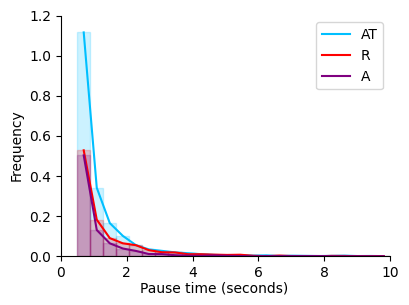

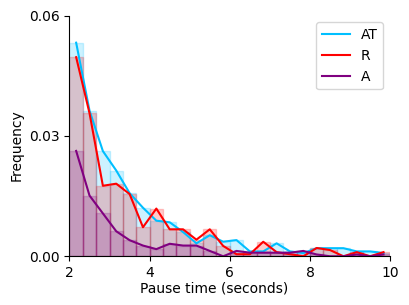

In [ ]:
# @title Panel I: Pause Duration Distribution in the Arena

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code

import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statistics
from scipy import stats
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as sp
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from statistics import mean

class Figure6_PanelI:
    def __init__(self, df, dependent_variable, hist = False):

        self.df = df
        self.dependent_variable = dependent_variable
        self.order = ['HT', 'R', 'H']                   # for parsing data so need "og" suffixes
        if hist:
            data = [df.loc[df["suffix3"] == s, dependent_variable].to_list() for s in self.order]
            self.N = [len(d) for d in data]
            self.data = [sum(d, []) for d in data]
        else:
            self.data = [self.df.loc[self.df["suffix3"] == s].loc[:,self.dependent_variable].to_list() for s in self.order]


        self.colors = ["deepskyblue","red",  "purple"]
        self.labels = ['AT', 'R', 'A']


    def create_boxplot(self, x_label, y_label, log_scale = False, outliers = True, figsize =(2, 3)):

        fig = plt.figure(figsize = figsize, facecolor=(1, 1, 1))
        ax = fig.add_axes([0, 0, 1, 1])

        # Creating plot
        bp = ax.boxplot(self.data, showfliers = outliers, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4, .6], widths = 0.1) # showmeans=True

        # edit boxplot appearance
        for patch, color in zip(bp['boxes'], self.colors):
            patch.set_facecolor(color)
            patch.set(color = color)

        color_index = 0
        for i, w in enumerate(bp['whiskers']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        color_index = 0
        for i, w in enumerate(bp['caps']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        outlier_alpha = 0.3
        for flier in bp['fliers']:
            flier.set(alpha=outlier_alpha)

        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_xlim(0,.8)

        if log_scale:
            ax.set_yticks(np.arange(0, 4))
            ax.set_yticklabels(10**np.arange(0, 4))

        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)


        return fig, ax

    def get_statisitics(self):
        sig_level = 0.05

        # Kruskal-Wallis H-test
        h , p = stats.kruskal(*self.data)

        # Dunn's Test
        p_values = sp.posthoc_dunn(self.data, p_adjust= 'bonferroni')  # format data properly

        a = str(stats.kruskal(*self.data)) + "\n"
        b = f'For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"} \n'
        c = f'For the difference between groups 2  (R) and 3 (H), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"} \n'
        d = f'For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"} \n'

        return f"{a}{b}{c}{d}"
        # check if p_values are higher than the level of significance false represents that two groups are statistically significant or that the null hypothesis is rejected


    def get_sum_stats(self):

        stats_df = self.df[["suffix3", self.dependent_variable]]
        sum_stats =  stats_df.groupby(['suffix3'], as_index=True).describe()
        sum_stats.columns = ['count', 'mean', 'std', 'min', 'Q1', 'median', 'Q3', 'max']
        sum_stats = sum_stats.loc[self.order].reset_index()
        sum_stats['IQR'] = sum_stats['Q3'] - sum_stats['Q1']

        sum_stats_str = ""
        for i in self.order:
            result = sum_stats.loc[sum_stats["suffix3"] == i]
            median = float(result['median'])
            IQR = float(result['IQR'])
            sum_stats_str += f"phase: {i} median = {median:.3f} IQR = {IQR:.3f} \n"

        return sum_stats_str

    def get_plot_title(self):
        return f"{self.dependent_variable} \n" + self.get_statisitics() + self.get_sum_stats()

    def create_histogram(self, x_min = 2, x_max = 10, num_bins = 25 ,y_max = .2,figsize=(10, 10), normalize = False):
        fig, axs = plt.subplots(1, 1, figsize = figsize)
        bin_num = np.linspace(x_min, x_max, num_bins )

        for i in range(3):
            n, bins, patches = axs.hist(self.data[i], bins = bin_num, color = self.colors[i], density = normalize, alpha = 0.2, edgecolor= self.colors[i]) # Create a histogram
            n_normalized = np.divide(n, self.N[i])                  # Divide the bin heights by the epsidoe count

            for patch, height in zip(patches, n_normalized):  # Update the heights of the histogram bars with the normalized values
                patch.set_height(height)

            bin_centers = (bins[:-1] + bins[1:]) / 2   # Calculate the bin centers
            plt.plot(bin_centers, n_normalized, color = self.colors[i], linewidth=1.5, label = self.labels[i])   # Connect the heights with a line

        axs.set_xlim([0, x_max])
        axs.set_ylim([0, y_max])
        plt.tight_layout()
        fig.text(0.5, 0.01, 'Pause time (seconds)', ha='center')
        fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical')
        legend = axs.legend(loc='upper right', bbox_to_anchor=(1, 1))
        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)

        return fig, axs

DownloadDataFile("df.pkl")

df = pd.read_pickle(DataFile("df.pkl"))

df['prey_trajectory_length_cm'] = df['prey_trajectory_length_canonical'] * 2.34 * 100    # convert trajectory length from canonical to cm
df.mouse = [i[3] for i in df.experiment.str.split('_')]

dependent_variable = "arena_pauseDurations_s"

arena_hist = Figure6_PanelI(df, dependent_variable, hist = True)
fig, ax = arena_hist.create_histogram(x_min = 0.5, x_max=10, num_bins =25 ,y_max=1.2, figsize=(4,3))
plt.show()
plt.close()

### inset
dependent_variable = "arena_pauseDurations_s"
fig, ax = arena_hist.create_histogram(x_min = 2, x_max = 10, num_bins = 25 ,y_max = 0.06, figsize=(4,3))


# Set the interval for the y-axis ticks
tick_interval = 0.03
ax = plt.gca()
ax.yaxis.set_major_locator(MultipleLocator(tick_interval))
ax.set_xlim([2, 10])
plt.show()

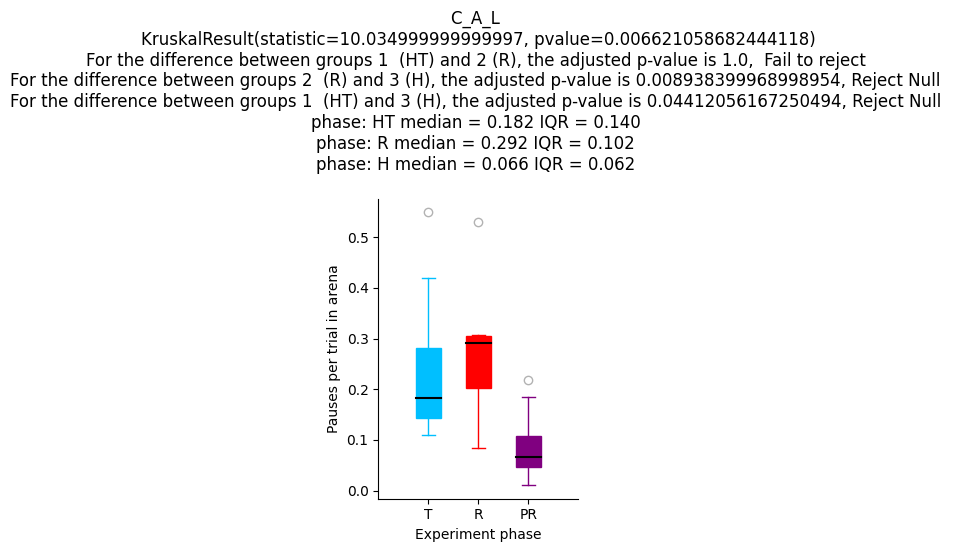

In [ ]:
# @title Panel J: Pauses in the Arena per Phase

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code

import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statistics
from scipy import stats
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as sp
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from statistics import mean

class Figure6_PanelJ:
    def __init__(self, df, dependent_variable, hist = False):

        self.df = df
        self.dependent_variable = dependent_variable
        self.order = ['HT', 'R', 'H']                   # for parsing data so need "og" suffixes
        if hist:
            data = [df.loc[df["suffix3"] == s, dependent_variable].to_list() for s in self.order]
            self.N = [len(d) for d in data]
            self.data = [sum(d, []) for d in data]
        else:
            self.data = [self.df.loc[self.df["suffix3"] == s].loc[:,self.dependent_variable].to_list() for s in self.order]


        self.colors = ["deepskyblue","red",  "purple"]
        self.labels = ['AT', 'R', 'A']


    def create_boxplot(self, x_label, y_label, log_scale = False, outliers = True, figsize =(2, 3)):

        fig = plt.figure(figsize = figsize, facecolor=(1, 1, 1))
        ax = fig.add_axes([0, 0, 1, 1])

        # Creating plot
        bp = ax.boxplot(self.data, showfliers = outliers, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4, .6], widths = 0.1) # showmeans=True

        # edit boxplot appearance
        for patch, color in zip(bp['boxes'], self.colors):
            patch.set_facecolor(color)
            patch.set(color = color)

        color_index = 0
        for i, w in enumerate(bp['whiskers']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        color_index = 0
        for i, w in enumerate(bp['caps']):
            w.set(color = self.colors[color_index])
            if i % 2 != 0:
                color_index += 1

        outlier_alpha = 0.3
        for flier in bp['fliers']:
            flier.set(alpha=outlier_alpha)

        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_xlim(0,.8)

        if log_scale:
            ax.set_yticks(np.arange(0, 4))
            ax.set_yticklabels(10**np.arange(0, 4))

        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)


        return fig, ax

    def get_statisitics(self):
        sig_level = 0.05

        # Kruskal-Wallis H-test
        h , p = stats.kruskal(*self.data)

        # Dunn's Test
        p_values = sp.posthoc_dunn(self.data, p_adjust= 'bonferroni')  # format data properly

        a = str(stats.kruskal(*self.data)) + "\n"
        b = f'For the difference between groups 1  (HT) and 2 (R), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"} \n'
        c = f'For the difference between groups 2  (R) and 3 (H), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"} \n'
        d = f'For the difference between groups 1  (HT) and 3 (H), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"} \n'

        return f"{a}{b}{c}{d}"
        # check if p_values are higher than the level of significance false represents that two groups are statistically significant or that the null hypothesis is rejected


    def get_sum_stats(self):

        stats_df = self.df[["suffix3", self.dependent_variable]]
        sum_stats =  stats_df.groupby(['suffix3'], as_index=True).describe()
        sum_stats.columns = ['count', 'mean', 'std', 'min', 'Q1', 'median', 'Q3', 'max']
        sum_stats = sum_stats.loc[self.order].reset_index()
        sum_stats['IQR'] = sum_stats['Q3'] - sum_stats['Q1']

        sum_stats_str = ""
        for i in self.order:
            result = sum_stats.loc[sum_stats["suffix3"] == i]
            median = float(result['median'])
            IQR = float(result['IQR'])
            sum_stats_str += f"phase: {i} median = {median:.3f} IQR = {IQR:.3f} \n"

        return sum_stats_str

    def get_plot_title(self):
        return f"{self.dependent_variable} \n" + self.get_statisitics() + self.get_sum_stats()

    def create_histogram(self, x_min = 2, x_max = 10, num_bins = 25 ,y_max = .2,figsize=(10, 10), normalize = False):
        fig, axs = plt.subplots(1, 1, figsize = figsize)
        bin_num = np.linspace(x_min, x_max, num_bins )

        for i in range(3):
            n, bins, patches = axs.hist(self.data[i], bins = bin_num, color = self.colors[i], density = normalize, alpha = 0.2, edgecolor= self.colors[i]) # Create a histogram
            n_normalized = np.divide(n, self.N[i])                  # Divide the bin heights by the epsidoe count

            for patch, height in zip(patches, n_normalized):  # Update the heights of the histogram bars with the normalized values
                patch.set_height(height)

            bin_centers = (bins[:-1] + bins[1:]) / 2   # Calculate the bin centers
            plt.plot(bin_centers, n_normalized, color = self.colors[i], linewidth=1.5, label = self.labels[i])   # Connect the heights with a line

        axs.set_xlim([0, x_max])
        axs.set_ylim([0, y_max])
        plt.tight_layout()
        fig.text(0.5, 0.01, 'Pause time (seconds)', ha='center')
        fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical')
        legend = axs.legend(loc='upper right', bbox_to_anchor=(1, 1))
        for pos in ['top', 'right']:
            plt.gca().spines[pos].set_visible(False)

        return fig, axs

DownloadDataFile("df.pkl")

df = pd.read_pickle(DataFile("df.pkl"))

df['prey_trajectory_length_cm'] = df['prey_trajectory_length_canonical'] * 2.34 * 100    # convert trajectory length from canonical to cm
df.mouse = [i[3] for i in df.experiment.str.split('_')]


grb = ["mouse" , "suffix3"]
dependent_variable = 'C_A_L'

# find the average trajectory length for each subject in each phase
group_df = df.groupby(grb, as_index=False).agg({dependent_variable:['mean']})
group_df.columns = grb + [dependent_variable]

# label axes
x_label = 'Experiment phase'
y_label = 'Pauses per trial in arena'

# create PhaseStatistics object
avg_pause_obj = Figure6_PanelJ(group_df, dependent_variable)


# plot
title = avg_pause_obj.get_plot_title()
fig, ax = avg_pause_obj.create_boxplot(x_label, y_label, False, True)


ax.set_xticklabels(["T", "R", "PR"])
ax.set_title(title)
plt.show()

##Figure 7

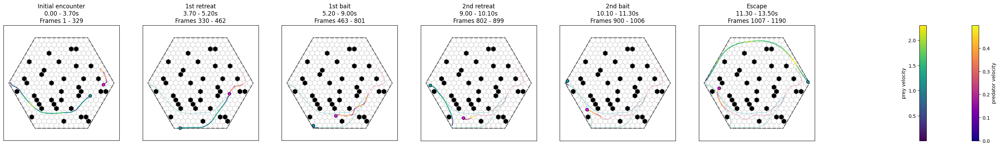

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

In [ ]:
#@title Panel A: Baiting Example

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code

from cellworld import *
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap


#Intialize JSON pose objects/lists
class PartList(JsonList):
  def __init__(self):
    super().__init__(list_type=PosePart)

class PosePart(JsonObject):
  def __init__(self):
    self.part = str()
    self.location = Location()
    self.camera = int()
    self.score = float()

def make_pose_list(trajectory):
  pose_data = PartList()
  for step in trajectory:
    p_data = json.loads(step.data)
    # pose_list = JsonList()
    for part in p_data[:]:
      pose_object = PosePart()
      pose_object.part = part['part']
      pose_object.location = location.Location(part['location']['x'], part['location']['y'])
      pose_object.camera = part['camera']
      pose_object.score = part['score']
      pose_data.append(pose_object)
  return pose_data



# plotting stuff
def get_predator_rect(pred_loc, pred_angle, d, dims=[.09 / 2.34, .12 / 2.34]):
    '''Gets the bounding box for the predator in canonical coords'''
    ts = d.ax.transData
    robot_w = dims[0]
    robot_l = dims[1]
    corner = (pred_loc.x - robot_w / 2, pred_loc.y - robot_l / 2)
    t = matplotlib.transforms.Affine2D().rotate_deg_around(pred_loc.x, pred_loc.y, degrees=-pred_angle)
    rect = matplotlib.patches.Rectangle(corner, robot_w, robot_l, linewidth=1, edgecolor='r', facecolor='none', transform=t + ts)
    pred_corners = rect.get_patch_transform().transform(rect.get_path().vertices[:-1])
    pred_corners = t.transform(pred_corners)
    pred_coords = []
    for corner in pred_corners:
        pred_coords.append(Location(x=corner[0], y=corner[1]))
    pred_coords.append(pred_loc)

    return pred_coords, rect


def plot_color(x, y, c=None, cmap='viridis', linewidth=2, zorder=None, ax=None, Norm=None, alpha=1.0, lighten=1.0):

  if c is None:
    c = np.ones(x.shape)

  #cmap = lighten_colormap(cmap, lighten)

  if Norm is None:
    norm = plt.Normalize(c.min(), c.max())
  else:
    norm = plt.Normalize(Norm[0], Norm[1])
  points = np.array([x, y]).T.reshape(-1, 1, 2)
  segments = np.concatenate([points[:-1], points[1:]], axis=1)
  lc = LineCollection(segments, cmap=cmap, norm=norm)
  lc.set_array(c)
  lc.set_linewidth(linewidth)
  lc.set_zorder(zorder)
  lc.set_alpha(alpha)
  if ax:
    line = ax.add_collection(lc)
  else:
    line = plt.gca().add_collection(lc)

  return line

def episode_to_dict(ep, n=10):

  def moving_average(x, w):
      return np.convolve(x, np.ones(w), 'same') / w

  steps = {'prey': {'location': [], 'time': []},
           'predator': {'location': [], 'time': []}}
  agents = np.unique(ep.trajectories.get('agent_name'))

  agents_trajectories = ep.trajectories.split_by_agent()
  for agent in agents_trajectories:
    trajectory = agents_trajectories[agent]
    x = trajectory.get('location').get('x')
    y = trajectory.get('location').get('y')
    t = trajectory.get('time_stamp')
    v = trajectory.get_velocities()[agent]
    f = trajectory.get('frame')
    steps[agent]['location'] = np.vstack([x,y]).T
    steps[agent]['time'] = np.array(t)
    steps[agent]['velocity'] = moving_average(np.array(v), n)
    steps[agent]['frame'] = np.array(f)

  # trim to mouse time
  I = np.where((steps['predator']['time'] >= steps['prey']['time'].min()).T &
                  (steps['predator']['time'] <= steps['prey']['time'].max()).T)
  steps['predator']['location']= steps['predator']['location'][I]
  steps['predator']['velocity'] = steps['predator']['velocity'][I]
  steps['predator']['time'] = steps['predator']['time'][I].squeeze() - steps['prey']['time'].min()
  steps['prey']['time'] = steps['prey']['time'].squeeze() - steps['prey']['time'].min()

  return steps

def plot_episode_frames(ep, time_frames, smoothing=10, labels=None, world='21_05', color_by='velocity', cmaps=['viridis', 'plasma'], map_to_frame=False, hab_visible=True):

  # create plots
  fig,ax = plt.subplots(1,len(time_frames),figsize=(5*len(time_frames),5))
  if 'Axes' in str(type(ax)):
    ax = [ax]

  # get episode data
  steps = episode_to_dict(ep, smoothing)
  w = World.get_from_parameters_names('hexagonal','canonical',world)

  # setup colors
  if type(cmaps) == str:
    cmaps = [cmaps, cmaps]
  agent_color = np.array([[0, 163, 175], [255, 0, 255]]) / 255
  tick_side = ['left','right']

  # for mouse and robot
  for i,key in enumerate(steps.keys()):
    x = steps[key]['location'][:,0]
    y = steps[key]['location'][:,1]
    t = steps[key]['time']
    f = steps[key]['frame']
    v = steps[key]['velocity'] * 2.34 # convert to m/s

    # select color variable
    if 'velocity' in color_by:
      cc = v
    else:
      cc = t

    # normalize colormap to frame span or whole trajectory
    if map_to_frame:
      mn = np.hstack(time_frames).min()
      mx = np.hstack(time_frames).max()
      NORM = [cc[np.argmin(np.abs(t - mn))], cc[np.argmin(np.abs(t - mx))]]
    else:
      NORM = [cc.min(), cc.max()]

    # plot each time frame
    for j in range(len(time_frames)):
      time = time_frames[j]
      if labels is None:
        label = ''
      else:
        label = labels[j]
      Ic = t <= time[0] + 0.01
      I = (t > time[0]) & (t <= time[1])
      frames = np.where(I)
      if 'time' in color_by:
        cv = plt.get_cmap(cmaps[i])(0)
      else:
        cv = plt.get_cmap(cmaps[i])(0.5)

      # plot
      d = Display(w, fig_size=(5,5), padding=0.1, cell_edge_color="lightgrey", habitat_edge_color='k', ax=ax[j])
      ax[j].plot(x[Ic], y[Ic], color = cv, alpha=0.3, zorder=9)
      #plot_color(x[Ic], y[Ic], c = cc[Ic], cmap = cmaps[i], Norm=NORM, ax=ax[j], alpha=0.2, zorder=0)
      h = plot_color(x[I], y[I], c = cc[I], cmap = cmaps[i], Norm=NORM, ax=ax[j], zorder=10)
      ax[j].scatter(x[I][-1], y[I][-1], c=[agent_color[i]], edgecolor='k', zorder=11)
      ax[j].set_aspect('equal','box')
      ax[j].set_title(f'{label}\n{time[0]:2.2f} - {time[1]:2.2f}s\nFrames {frames[0][0]} - {frames[0][-1]}')

      # colorbars
      if j == len(time_frames)-1:
        cb_ax = fig.add_axes([(ax[j].get_position().x1+0.1+((i)*0.05)),
                              ax[j].get_position().y0,
                              0.04/len(time_frames),
                              ax[j].get_position().height])
        fig.colorbar(h, orientation='vertical', label=f'{key} {color_by}', cax=cb_ax, fraction=0.046, pad=0.04)
        cb_ax.yaxis.set_ticks_position(tick_side[i])
        cb_ax.yaxis.set_label_position(tick_side[i])

      # remove hab
      if not hab_visible:
        [p.remove() for p in d.ax.patches[:-1]];

  plt.tight_layout()

  return fig, ax

DownloadDataFile("PEEK_20221129_1124_MMM11_21_05_RT8_episode_8.json")

ep = Episode.load_from_file(DataFile("PEEK_20221129_1124_MMM11_21_05_RT8_episode_8.json"))

time_frames = [(0, 3.7), (3.7, 5.2), (5.2, 9), (9,10.1), (10.1, 11.3), (11.3,13.5)]
labels = ['Initial encounter', '1st retreat', '1st bait', '2nd retreat', '2nd bait', 'Escape']

fig, ax = plot_episode_frames(ep, time_frames, labels=labels)

['body_mid' 'head_base' 'left_ear' 'nose' 'right_ear' 'tail_base'
 'tail_mid' 'tail_tip']
[{"part":"nose","location":{"x":0.023410472988843974,"y":0.4981756909480094},"camera":0,"score":0.9999735355377197},{"part":"left_ear","location":{"x":0.016898535161971935,"y":0.5031349501302242},"camera":0,"score":0.9991452693939209},{"part":"right_ear","location":{"x":0.015784520625829586,"y":0.49723153474831583},"camera":0,"score":0.9447726607322693},{"part":"head_base","location":{"x":0.015941042423009984,"y":0.49995940092110625},"camera":0,"score":0.9892672300338745},{"part":"body_mid","location":{"x":0.01355985362803936,"y":0.5032493202676773},"camera":0,"score":0.000338874728186056},{"part":"tail_base","location":{"x":0.021524272829055786,"y":0.4972514315237999},"camera":0,"score":0.000135199778014794},{"part":"tail_mid","location":{"x":0.0271620228586198,"y":0.49764558958911886},"camera":0,"score":0.00019244775467086583},{"part":"tail_tip","location":{"x":0.02488667142367363,"y":0.49940048

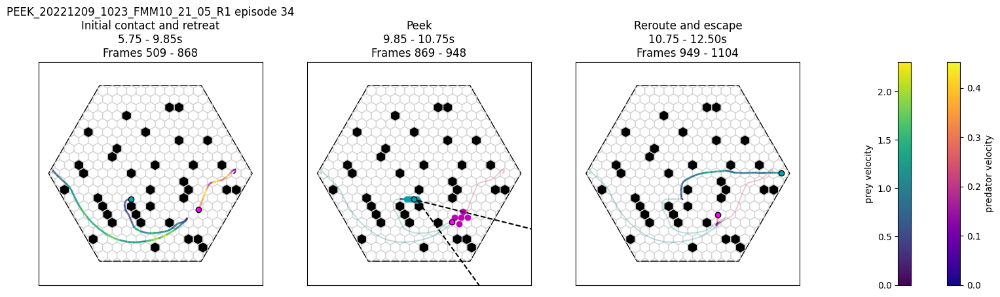

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

<Figure size 500x500 with 0 Axes>

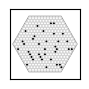

In [ ]:
#@title Panel B: Peeking Example

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code

from cellworld import *
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap


#Intialize JSON pose objects/lists
class PartList(JsonList):
  def __init__(self):
    super().__init__(list_type=PosePart)

class PosePart(JsonObject):
  def __init__(self):
    self.part = str()
    self.location = Location()
    self.camera = int()
    self.score = float()

def make_pose_list(trajectory):
  pose_data = PartList()
  for step in trajectory:
    p_data = json.loads(step.data)
    # pose_list = JsonList()
    for part in p_data[:]:
      pose_object = PosePart()
      pose_object.part = part['part']
      pose_object.location = location.Location(part['location']['x'], part['location']['y'])
      pose_object.camera = part['camera']
      pose_object.score = part['score']
      pose_data.append(pose_object)
  return pose_data



# plotting stuff
def get_predator_rect(pred_loc, pred_angle, d, dims=[.09 / 2.34, .12 / 2.34]):
    '''Gets the bounding box for the predator in canonical coords'''
    ts = d.ax.transData
    robot_w = dims[0]
    robot_l = dims[1]
    corner = (pred_loc.x - robot_w / 2, pred_loc.y - robot_l / 2)
    t = matplotlib.transforms.Affine2D().rotate_deg_around(pred_loc.x, pred_loc.y, degrees=-pred_angle)
    rect = matplotlib.patches.Rectangle(corner, robot_w, robot_l, linewidth=1, edgecolor='r', facecolor='none', transform=t + ts)
    pred_corners = rect.get_patch_transform().transform(rect.get_path().vertices[:-1])
    pred_corners = t.transform(pred_corners)
    pred_coords = []
    for corner in pred_corners:
        pred_coords.append(Location(x=corner[0], y=corner[1]))
    pred_coords.append(pred_loc)

    return pred_coords, rect


def plot_color(x, y, c=None, cmap='viridis', linewidth=2, zorder=None, ax=None, Norm=None, alpha=1.0, lighten=1.0):

  if c is None:
    c = np.ones(x.shape)

  #cmap = lighten_colormap(cmap, lighten)

  if Norm is None:
    norm = plt.Normalize(c.min(), c.max())
  else:
    norm = plt.Normalize(Norm[0], Norm[1])
  points = np.array([x, y]).T.reshape(-1, 1, 2)
  segments = np.concatenate([points[:-1], points[1:]], axis=1)
  lc = LineCollection(segments, cmap=cmap, norm=norm)
  lc.set_array(c)
  lc.set_linewidth(linewidth)
  lc.set_zorder(zorder)
  lc.set_alpha(alpha)
  if ax:
    line = ax.add_collection(lc)
  else:
    line = plt.gca().add_collection(lc)

  return line

def episode_to_dict(ep, n=10):

  def moving_average(x, w):
      return np.convolve(x, np.ones(w), 'same') / w

  steps = {'prey': {'location': [], 'time': []},
           'predator': {'location': [], 'time': []}}
  agents = np.unique(ep.trajectories.get('agent_name'))
  agents_trajectories = ep.trajectories.split_by_agent()

  for agent in agents_trajectories:
    trajectory = agents_trajectories[agent]
    x = trajectory.get('location').get('x')
    y = trajectory.get('location').get('y')
    t = trajectory.get('time_stamp')
    v = trajectory.get_velocities()[agent]
    f = trajectory.get('frame')

    steps[agent]['location'] = np.vstack([x,y]).T
    steps[agent]['time'] = np.array(t)
    steps[agent]['velocity'] = moving_average(np.array(v), n)
    steps[agent]['frame'] = np.array(f)

  # trim to mouse time
  I = np.where((steps['predator']['time'] >= steps['prey']['time'].min()).T &
                  (steps['predator']['time'] <= steps['prey']['time'].max()).T)
  steps['predator']['location']= steps['predator']['location'][I]
  steps['predator']['velocity'] = steps['predator']['velocity'][I]
  steps['predator']['time'] = steps['predator']['time'][I].squeeze() - steps['prey']['time'].min()
  steps['prey']['time'] = steps['prey']['time'].squeeze() - steps['prey']['time'].min()

  return steps

def plot_episode_frames(ep, time_frames, smoothing=10, labels=None, world='21_05', color_by='velocity', cmaps=['viridis', 'plasma'], map_to_frame=False, hab_visible=True):

  # create plots
  fig,ax = plt.subplots(1,len(time_frames),figsize=(5*len(time_frames),5))
  if 'Axes' in str(type(ax)):
    ax = [ax]

  # get episode data
  steps = episode_to_dict(ep, smoothing)
  w = World.get_from_parameters_names('hexagonal','canonical',world)

  # setup colors
  if type(cmaps) == str:
    cmaps = [cmaps, cmaps]
  agent_color = np.array([[0, 163, 175], [255, 0, 255]]) / 255
  tick_side = ['left','right']

  # for mouse and robot
  for i,key in enumerate(steps.keys()):
    x = steps[key]['location'][:,0]
    y = steps[key]['location'][:,1]
    t = steps[key]['time']
    f = steps[key]['frame']
    v = steps[key]['velocity'] * 2.34 # convert to m/s

    # select color variable
    if 'velocity' in color_by:
      cc = v
    else:
      cc = t

    # normalize colormap to frame span or whole trajectory
    if map_to_frame:
      mn = np.hstack(time_frames).min()
      mx = np.hstack(time_frames).max()
      NORM = [cc[np.argmin(np.abs(t - mn))], cc[np.argmin(np.abs(t - mx))]]
    else:
      NORM = [cc.min(), cc.max()]

    # plot each time frame
    for j in range(len(time_frames)):
      time = time_frames[j]
      if labels is None:
        label = ''
      else:
        label = labels[j]
      Ic = t <= time[0] + 0.01
      I = (t > time[0]) & (t <= time[1])
      frames = np.where(I)
      if 'time' in color_by:
        cv = plt.get_cmap(cmaps[i])(0)
      else:
        cv = plt.get_cmap(cmaps[i])(0.5)

      # plot
      d = Display(w, fig_size=(5,5), padding=0.1, cell_edge_color="lightgrey", habitat_edge_color='k', ax=ax[j])
      ax[j].plot(x[Ic], y[Ic], color = cv, alpha=0.3, zorder=9)
      #plot_color(x[Ic], y[Ic], c = cc[Ic], cmap = cmaps[i], Norm=NORM, ax=ax[j], alpha=0.2, zorder=0)
      h = plot_color(x[I], y[I], c = cc[I], cmap = cmaps[i], Norm=NORM, ax=ax[j], zorder=10)
      ax[j].scatter(x[I][-1], y[I][-1], c=[agent_color[i]], edgecolor='k', zorder=11)
      ax[j].set_aspect('equal','box')
      ax[j].set_title(f'{label}\n{time[0]:2.2f} - {time[1]:2.2f}s\nFrames {frames[0][0]} - {frames[0][-1]}')

      # colorbars
      if j == len(time_frames)-1:
        cb_ax = fig.add_axes([(ax[j].get_position().x1+0.1+((i)*0.05)),
                              ax[j].get_position().y0,
                              0.04/len(time_frames),
                              ax[j].get_position().height])
        fig.colorbar(h, orientation='vertical', label=f'{key} {color_by}', cax=cb_ax, fraction=0.046, pad=0.04)
        cb_ax.yaxis.set_ticks_position(tick_side[i])
        cb_ax.yaxis.set_label_position(tick_side[i])

      # remove hab
      if not hab_visible:
        [p.remove() for p in d.ax.patches[:-1]];

  plt.tight_layout()

  return fig, ax

DownloadDataFile("PEEK_20221209_1023_FMM10_21_05_R1_episode_34.json")

ep = Episode.load_from_file(DataFile("PEEK_20221209_1023_FMM10_21_05_R1_episode_34.json"))

folder = "PEEK_20221209_1023_FMM10_21_05_R1"
episode = 34

# plot the peek sequence
time_frames = [(5.75, 9.85), (9.85, 10.75), (10.75, 12.50)]
labels = [f'{folder} episode {episode}\nInitial contact and retreat', 'Peek', 'Reroute and escape']
fig, ax = plot_episode_frames(ep, time_frames, labels=labels);


# get pose at time of peek
time = 10.311 # precise peek time
preyt = ep.trajectories.where('agent_name','prey')
predt = ep.trajectories.where('agent_name','predator')
prey_ts = np.array(preyt.get('time_stamp'))
pred_ts = np.array(predt.get('time_stamp'))
pred_ts = pred_ts - prey_ts[0]
prey_ts = prey_ts - prey_ts[0]
preyi = np.argmin(np.abs(prey_ts - time))
predi = np.argmin(np.abs(pred_ts - time))
pose = make_pose_list(preyt)
parts = np.unique(np.array(pose.get('part')))
head_loc = pose.where('part','nose').get('location')[preyi]
pred_loc = predt.get('location')[predi]
pred_angle = predt.get('rotation')[predi]

# display the world to get the predator coordinate system
w = World.get_from_parameters_names('hexagonal', 'canonical', '21_05')
d = Display(w, fig_size=(1,1))

# plot prey and predator pose
print (parts)
print(pose)
# for p in parts:
#   part = pose.where('part',p).get('location')[preyi]
#   ax[1].scatter(part.x, part.y, color=np.array([0, 163, 175]) / 255, zorder=10)

for p in parts:
  part = pose.filter(lambda i: i.part == p)
  part_location = part.get('location')[preyi]
  ax[1].scatter(part_location.x, part_location.y, color=np.array([0, 163, 175]) / 255, zorder=10)

pred_coords,_ = get_predator_rect(pred_loc, pred_angle, d)
for p in pred_coords:
  ax[1].scatter(p.x, p.y, color='m', zorder=10)

# plot binocular rays
head_angle = preyt.get('rotation')[preyi]
ray_x = [head_loc.x, head_loc.x + np.sin(np.deg2rad(head_angle+20))]
ray_y = [head_loc.y, head_loc.y + np.cos(np.deg2rad(head_angle+20))]
ax[1].plot(ray_x, ray_y, 'k--', zorder=10)
ray_x = [head_loc.x, head_loc.x + np.sin(np.deg2rad(head_angle-20))]
ray_y = [head_loc.y, head_loc.y + np.cos(np.deg2rad(head_angle-20))]
ax[1].plot(ray_x, ray_y, 'k--', zorder=10)

# Supplemental Figures

##Figure 1

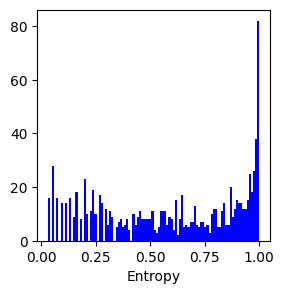

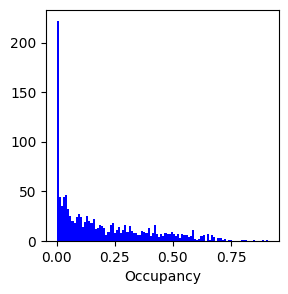

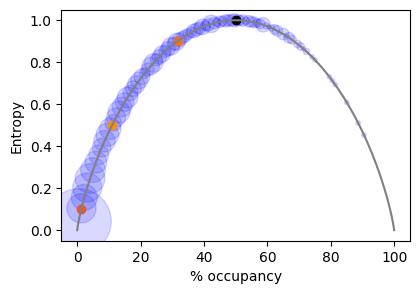

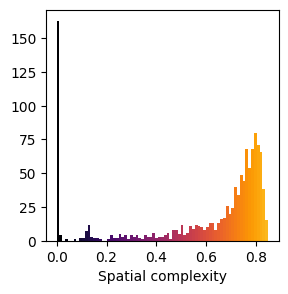

In [ ]:
#@title Panel B-E: Complexity and Entropy Analysis

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code


from cellworld import *
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

DownloadDataFile("entropy.json")
DownloadDataFile("occupancy.json")
DownloadDataFile("netcomp.json")

l1 = JsonList(list_type=float).load_from_file(DataFile("entropy.json"))
l2 = JsonList(list_type=float).load_from_file(DataFile("occupancy.json"))
l3 = JsonList(list_type=float).load_from_file(DataFile("netcomp.json"))
world = World.get_from_parameters_names("hexagonal", "canonical")

fig,ax = plt.subplots(1, 1, figsize=(3,3))
ax.set_xlabel('Entropy')
n, bins, patches = plt.hist([x for x in l1 if x], bins=100, color='blue')
bin_centers = 0.5 * (bins[:-1] + bins[1:])
plt.show()
plt.close()
#

fig,ax = plt.subplots(1, 1, figsize=(3,3))
ax.set_xlabel('Occupancy')
n, bins, patches = plt.hist(l2, bins=100, color='blue')
bin_centers = 0.5 * (bins[:-1] + bins[1:])
entropies = [world.entropy(b*331) for b in bin_centers]
plt.show()
plt.close()

maze_dicts = {
    'Random 0.9': [0.9, 0.6830942374506147,0.31722054380664655,3.4886047116691907],
    'Random 0.5': [0.5, 0.752858652442668,0.10876132930513595,7.272349432516481],
    'Random 0.1': [0.1, 0.6249278104864396,0.012084592145015106,14.589222908653806],
    'Checkerboard': [1.0,0.0,0.5,1.8317698969644196]}

def entropy(occlusion_count: int, base: float = math.e):
    ent = 0
    cell_count = 331
    probabilities = [occlusion_count / cell_count, (cell_count - occlusion_count) / cell_count]
    for p in probabilities:
        if p > 0:
            ent -= p * math.log(p, base)
    return ent / math.log(len(probabilities), base)

fig,ax = plt.subplots(1, 1, figsize=(4.5,3))
cmap = plt.cm.inferno
ax.set_xlabel('Occupancy')
ax.scatter(bin_centers*100,entropies, s=n*10, alpha = 0.15, color = 'blue')
occlusion_counts = np.linspace(0,331,331)
clutter = []
for o in occlusion_counts:
    clutter.append(entropy(o))
for key,item in maze_dicts.items():
    ax.scatter(item[2]*100, item[0], label = key, color = cmap(item[1]))

ax.plot([o/331*100 for o in occlusion_counts], clutter, color = 'grey')
ax.set_xlabel('% occupancy')
ax.set_ylabel('Entropy')

plt.show()

fig,ax = plt.subplots(1, 1, figsize=(3,3))
ax.set_xlabel('Spatial complexity')
cmap = plt.cm.inferno
n, bins, patches = plt.hist([x for x in l3], bins=75, color='green')
bin_centers = 0.5 * (bins[:-1] + bins[1:])
col = bin_centers - min(bin_centers)
for c, p in zip(col, patches):
    plt.setp(p, 'facecolor', cmap(c))
plt.show()

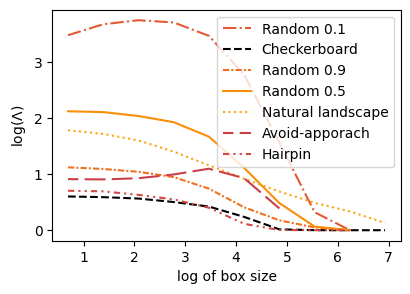

In [ ]:
#@title Panel G: Lacunarity Analysis

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code


import matplotlib.pyplot as plt
from cellworld import *
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from PIL import Image

class calcLac():
  def __init__(self, bodynormed, worldnormed, obstacularity):
    self.bodynormed = bodynormed
    self.worldnormed = worldnormed
    self.obstacularity = obstacularity

  def getMatrix(self, image, xmeters:float, bodylen: float) -> (np.array, np.array, float, float):
    # width is 1145 cells, for 2.34 m
    # 489.316 cells per meter
    # a mouse is 7-10 cm. Let's say 7 cm
    # so cells2bodylen = 489*.07 = 34.25
    # cells2bodylen = 34
    # pixels_pm = 489.316
    pixels_pm = image.size[0]/xmeters
    cells2bodylen = round(bodylen*pixels_pm)

    if self.bodynormed:
        # resize the image so that one body length
        # uses e^2 or ~7.9 pixels
        # This way at log(2) all should line up
        #
        # Divide width of image by cells2bodylen
        # height of image is [0], and width is [1], from .shape

        original_width, original_height = image.size
        new_height=int(round((original_height/cells2bodylen)*math.exp(2),0))
        new_width=int(round((original_width/cells2bodylen)*math.exp(2),0))
        # for hex* that comes out to 245 pixels wide
        resized_img = image.resize((new_width, new_height), Image.NEAREST)
        #resized_img = image.resize((new_width, new_height), Image.LANCZOS)
        image = resized_img

    if self.worldnormed:
        # resize images for a consistent pixels per meter
        # so catalyst, 4.1 ppm and 1120 pixels
        # and hexagons 325.945 ppm and 775 pixels
        # and Okavango at 4.457 ppm and 8192 pixels,
        # all go to same ppm

        # choice of ppm: we want at least one pixel per cm
        # so a ppm of 100
        base_ppm = 100
        original_width, original_height = image.size
        scale_factor = base_ppm/pixels_pm
        new_height=int(round((original_height*scale_factor),0))
        new_width=int(round((original_width*scale_factor),0))
        resized_img = image.resize((new_width, new_height), Image.NEAREST)
        image = resized_img

    gray_img = image.convert('L')

    # Convert images to numpy arrays
    image = np.array(image).astype('float')
    numpy_img = np.array(gray_img)

    if len(image.shape)!=2:
        # Mask where green is 255
        # Where r and b channels are not 255 since if that's true then g will be as white
        green_mask = (image[:,:,1] == 255) & (image[:,:,0] != 255) & (image[:,:,2] != 255)

    # Convert grayscale image to binary
    # Choose a threshold (any pixel value less than threshold becomes 0, otherwise it becomes 1)
    threshold = 250

    # Convert grayscale image to binary
    # In our standard images we use black for the occupied
    # habitat, white for the unoccupied
    #
    # Black is 0, white is 255
    # We want black to go to 1
    # We want white to go to 0
    # Everything > round(255/2)=128 is going to go to 0
    # The rest goes to black

    if not obstacularity:
        binarized_img = np.where(numpy_img > threshold, 0, 1)
    else:
        binarized_img = np.where(numpy_img > threshold, 1, 0)

    if len(image.shape)!=2:
        binarized_img = binarized_img.astype(float)
        # Replace pixels in the binary image that correspond to np.nan in the green channel of the original image
        binarized_img[green_mask] = np.nan

    #ipdb.set_trace()
    return(binarized_img, image, cells2bodylen, pixels_pm)


  def gen_lac_data(self,image,  xmeters:float, bodylen: float) -> (list, list, list):
    (np_array, orig_image, cells2bodylen,pixels_pm) = self.getMatrix(image, xmeters, bodylen)

    # Prepare lists to hold results
    box_sizes = []
    ratios = []

    # for now lets use steps of 100 for landscapes with cells > 1000 < 10000
    # for now lets use steps of 10 for landscapes with cells > 100 < 1000
    # for now lets use steps of 1 for landscapes with cells > 1 < 100
    #step_size = 10**(math.floor(math.log10(np_array.shape[1]))-1)
    #print('step size: ', step_size)
    # step_size = 10
    # Generate the list of box sizes
    # Calculate the maximum power of 2 that can be used
    max_power = math.floor(math.log2(np_array.shape[1]))
    boxgen = [2**n for n in range(1,max_power+1)]
    # select only the last 8 elements if available
    #boxgen = boxgen[-8:]
    #print('for', choice)
    #print(boxgen)
    #print(max_power, 'is max power', np_array.shape[1], 'is shape[1]')
    #boxgen = [n for n in range(1,np_array.shape[1]+1,step_size)]
    #boxgen.insert(0,[10, 20, 30, 40, 50, 60, 70, 80, 90])

    for bsize in boxgen:
        # Define the size of the box
        box_size = (bsize, bsize)

        # compute max possible sum in the box
        max_sum = box_size[0] * box_size[1]

        # Initialize a dictionary to store the counts of each sum
        sum_counts = {k: 0 for k in range(max_sum + 1)}

        # Define the variables xskip and yskip
        #xskip = step_size
        #yskip = step_size
        #xskip = bsize
        #yskip = bsize
        xskip = 20
        yskip = 20

        # track rejected boxes due to NaN
        nan_rejected=0

        validbox=0
        for i in range(0,np_array.shape[0] - box_size[0] + 1, yskip):
            for j in range(0,np_array.shape[1] - box_size[1] + 1, xskip):
                # Extract the region of the matrix that the box currently covers
                region = np_array[i:i+box_size[0], j:j+box_size[1]]
                # Compute the sum of the values in this region
                region_sum = np.sum(region)
                # Update the count of this sum
                # ONLY IF IT IS NOT A NaN
                # (which it becomes if any element is)
                if not np.isnan(region_sum):
                    sum_counts[region_sum] += 1
                    validbox +=1
                else:
                    nan_rejected += 1

        # Also, update the calculation for the total number of boxes to account for the steps:
        num_boxes = ((np_array.shape[0] - box_size[0])//yskip + 1) * ((np_array.shape[1] - box_size[1])//xskip + 1)

        # Delete the number of rejected NaN boxes
        num_boxes -= nan_rejected
        #ipdb.set_trace(context=10)

        # Normalize the counts in sum_counts by dividing them by the total number of boxes
        if num_boxes > 0:
            for sum_ in sum_counts:
                sum_counts[sum_] /= num_boxes
        else:
            sum_counts[sum_] = np.nan

        # Initialize mu and sigmasquared
        mu = 0
        sigmasquared = 0

        # Compute mu and sigmasquared
        for key, value in sum_counts.items():
            mu += key * value
            sigmasquared += key**2 * value

        # Compute sigma_squared / mu^2 and take the natural log
        if mu > 0:
            ratio = (sigmasquared / mu**2)
        else:
            ratio = np.nan  # undefined if mu is zero

        # Store results
        if not np.isnan(ratio):
            box_sizes.append(bsize)
            ratios.append(ratio)

        # # Store results for each choice
        # all_box_sizes.append(box_sizes)
        # #print('line 571 for choice', choice, 'box sizes', box_sizes, 'ratios: ', ratios)
        # all_ratios.append(ratios)
        # all_cells2body.append(cells2bodylen)
        # all_pixels_pm.append(pixels_pm)

        # showlandscape(choice, box_sizes, ratios, np_array, orig_image, cells2bodylen, pixels_pm)

    return(box_sizes, ratios, cells2bodylen)


  def trapezoidal_rule_integration(self, x, y):
    if len(x) != len(y) or len(x) < 2:
        raise ValueError("x and y should have the same length and at least two points.")

    integral = 0.0
    for i in range(1, len(x)):
        h = x[i] - x[i - 1]
        integral += h * (y[i] + y[i - 1]) / 2.0

    return integral

from numpy.core.fromnumeric import nonzero

experiment_files = {"maps/hex_entropy_1.png": ['Random 0.1', (2.34, .07), 0.6249278104864396, 'dashdot'],
                    "maps/checkerboard_1145.png": ['Checkerboard', (2.34, .07), 0.0, 'dashed'],
                    "maps/hex_entropy_009_000.png": ['Random 0.9', (2.34, .07), 0.6830942374506147, (0, (3, 1, 1, 1))],
                    "maps/hex_entropy_005_000.png": ['Random 0.5', (2.34, .07), 0.752858652442668, 'solid'],
                    "maps/Okavango_MIDLAC_2x_bin.png": ['Natural landscape', (1837.77, 1.75), 0.80, 'dotted'],
                    "maps/approach_avoid.png": ['Avoid-apporach', (2.34, .07), 0.54, (5, (10, 3))],
                    "maps/hairpin.png": ['Hairpin', (2.34, .07), 0.5668586383189034, (0, (3, 2, 1, 2, 1, 2))]}

bodynormed = False
worldnormed = False
showpatch = False
obstacularity = False
cmap = plt.cm.inferno
CL = calcLac(bodynormed=bodynormed,worldnormed=worldnormed, obstacularity=obstacularity)

fig,ax = plt.subplots(1, 1, figsize=(4.5,3))
ax.set_xlabel('log of box size')
ax.set_ylabel('log($\Lambda$)')
for f, variables in experiment_files.items():
  DownloadDataFile(f)
  image = Image.open(DataFile(f))
  xmeter = variables[1][0]
  bodylen = variables[1][1]

  box_sizes, ratios, cells2body = CL.gen_lac_data(image, xmeter, bodylen)
  log_box_sizes = np.log(box_sizes)
  log_ratios = np.log(ratios)
  LV = CL.trapezoidal_rule_integration(np.log(box_sizes), np.log(ratios))

  linestyle = variables[3]
  complexity = variables[2]
  label = variables[0] + f' (LV:{round(LV, 1)})'
  ax.plot(np.log(box_sizes), np.log(ratios), linestyle=linestyle, label=variables[0],
                color=cmap(complexity))
plt.legend()


##Figure 2

Text(0.5, 0, 'Error (%)')

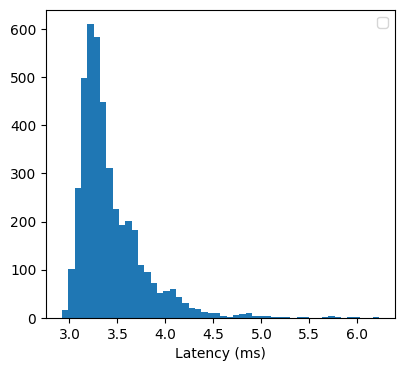

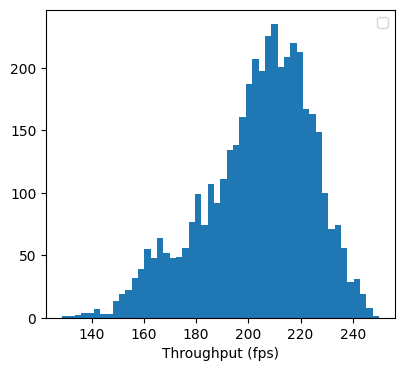

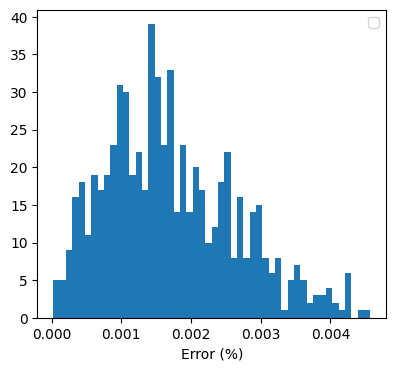

In [ ]:
# @title Supplemental Camera Metrics

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import json

DownloadDataFile('latency_data.json')
DownloadDataFile('throughput_data.json')
DownloadDataFile('stitching_error.json')

latency = json.load(open(DataFile('latency_data.json')))
throughput = json.load(open(DataFile('throughput_data.json')))
error = json.load(open(DataFile('stitching_error.json')))


fig,ax = plt.subplots(1, 1, figsize=(4.5,4))
ax.hist(latency, 50)
ax.legend()
ax.set_xlabel('Latency (ms)')

fig,ax = plt.subplots(1, 1, figsize=(4.5,4))
ax.hist(throughput, 50)
ax.legend()
ax.set_xlabel('Throughput (fps)')

fig,ax = plt.subplots(1, 1, figsize=(4.5,4))
ax.hist(error, 50)
ax.legend()
ax.set_xlabel('Error (%)')


##Figure 3

DR
460
PR
211


<ipython-input-25-1326f3feac82>:157: RuntimeWarning: Mean of empty slice
  puff = np.nanmean(dists[tv == 1,90:], axis=1)


Text(0.5, 1.0, 'RanksumsResult(statistic=18.835447934792317, pvalue=3.86840321370187e-79)\nno_puff median: 25.45119325678012, IQR: 10.70959053511806\npuff median: 92.69674393731762, IQR: 36.359479756206156')

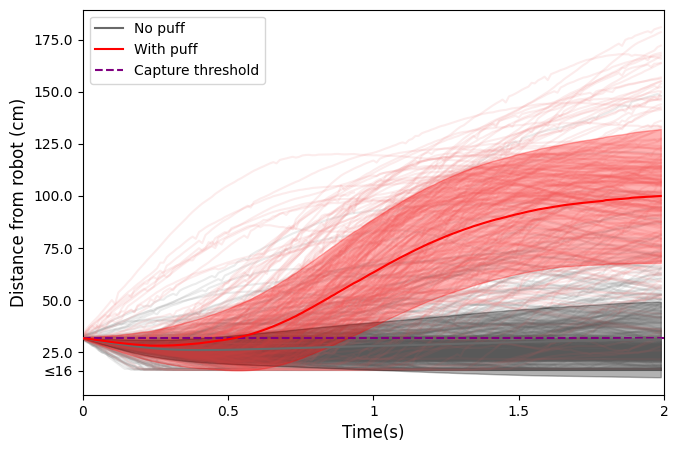

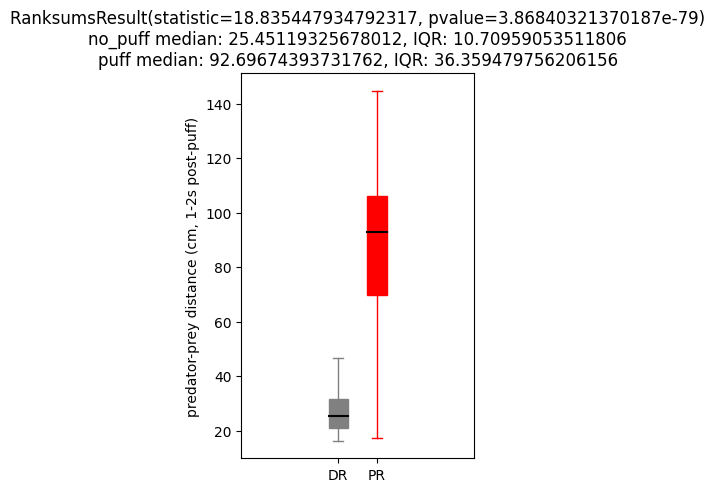

In [ ]:
# @title Panel A-B: Distance to Robot with and without Air Puff

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

experiment_files = Experiment_list

for f in experiment_files:
  DownloadDataFile(f.file)
#  df = pd.read_hdf(DataFile(f.file))

#  Figure code

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ranksums, iqr
import os
import json
fig,ax = plt.subplots(1, 1, figsize=(7.5,5))

DownloadDataFile('control_dist_dict.json')
dist_dict = json.load(open(DataFile('control_dist_dict.json')))

color_dict = {'PR':['lightcoral','red','red'],'DR':['grey','black','dimgrey']}
tags = ['DR','PR']
tag_labels = {'DR': 'No puff','PR': 'With puff'}

# chris added 8/21/23
tag_index = {'DR': 0, 'PR': 1}
tag_vec = []
dist_mat = []

for tag in tags:
  print(tag)
  all_dists = []
  for dist in dist_dict[tag]:
    np_dist = np.array(dist)

    cap_index = np.where(np_dist < 0.13531646934)[0]
    cap_start_index = [cap_index[0]]
    cap_start_index = cap_start_index + [cap_index[i+1] for i in list(np.where(np.diff(np.where(np_dist < 0.13531646934)[0])>1)[0])]

    start = 0
    end = 180

    i = cap_start_index[0]
    start_i = max(i+start,0)
    start_pad = np.array([np.nan] * abs(min(i+start,0)))
    end_i = min(i+end,len(np_dist))
    end_pad = np.array([np.nan] * (max((i+end)-len(np_dist),0)))
    dist_seg = (np.concatenate((start_pad,np_dist[start_i:end_i],end_pad))) * 2.34 * 100
    # ax.plot(range(end-start),dist_seg, alpha = 0.1, color = color_dict[tag][0],zorder = 6)

    for j, i in enumerate(cap_start_index[1:]):
      if (i - cap_start_index[j-1]) < 2.0*90:
        continue

      start_i = max(i+start,0)
      start_pad = np.array([np.nan] * abs(min(i+start,0)))
      end_i = min(i+end,len(np_dist))
      end_pad = np.array([np.nan] * (max((i+end)-len(np_dist),0)))

      dist_seg = (np.concatenate((start_pad,np_dist[start_i:end_i],end_pad))) * 2.34 * 100

      # print(len(dist_seg))

      # if list(start_pad) or list(end_pad):
      #   print('')
      #   print((start_i,end_i))
      #   print((0,len(np_dist)))
      ax.plot(range(end-start),dist_seg,alpha = 0.15, color = color_dict[tag][0])
      all_dists.append(dist_seg)

      # chris added 8/21/23
      tag_vec.append(tag_index[tag])
      dist_mat.append(dist_seg)

  np_all_dists = np.array(all_dists)
  print(len(np_all_dists))

  dist_mean = np.nanmean(np_all_dists, axis = 0)
  dist_stddev = np.nanstd(np_all_dists, axis = 0)
  ax.plot(range(end-start),dist_mean,alpha = 1, color = color_dict[tag][2], zorder = 10, linewidth = 1.5,label = tag_labels[tag])
  ax.fill_between(range(end-start), dist_mean-dist_stddev, dist_mean+dist_stddev, color = color_dict[tag][1], zorder = 8, alpha = 0.3)
plt.axhline(y=0.13531646934*2.34*100, color='purple', linestyle='--',alpha = 1, zorder = 9, label = 'Capture threshold')
ax.set_xticks([0,45,90,135,180])
ax.set_yticks([16] + list(np.linspace(25,175,7)))
ax.set_yticklabels(['≤16'] + [str(num) for num in np.linspace(25,175,7)])
ax.set_xticklabels([0,0.5,1,1.5,2])
# ax.set_yticks([0, 140])
ax.set_xlabel('Time(s)',fontsize = 12)
ax.set_ylabel('Distance from robot (cm)', fontsize = 12)
ax.set_xlim([start,end])
# ax.set_ylim([0,150])
ax.legend()
base_output = '/content/drive/MyDrive/MacIver Lab: Habitat/hab_methods/code/CodeFigures/'

tv = np.array(tag_vec)
dists = np.array(dist_mat)
no_puff = np.nanmean(dists[tv == 0,90:], axis=1)
puff = np.nanmean(dists[tv == 1,90:], axis=1)

fig, ax = plt.subplots(1, 1, figsize=(3,5))
bp = ax.boxplot([no_puff, puff[~np.isnan(puff)]], showfliers = False, patch_artist= True, medianprops = dict(color = "black", linewidth = 1.5), positions=[0.2, .4], widths = 0.1)

# edit boxplot appearance
colors = ["grey", "red"]
for patch, color in zip(bp['boxes'], colors):
  patch.set_facecolor(color)
  patch.set(color = color)

color_index = 0
for i, w in enumerate(bp['whiskers']):
  w.set(color = colors[color_index])
  if i % 2 != 0:
    color_index += 1

color_index = 0
for i, w in enumerate(bp['caps']):
  w.set(color = colors[color_index])
  if i % 2 != 0:
    color_index += 1

outlier_alpha = 0.3
for flier in bp['fliers']:
  flier.set(alpha=outlier_alpha)

ax.set_xticklabels(tags)
ax.set_ylabel('predator-prey distance (cm, 1-2s post-puff)')
ax.set_title(f'{ranksums(puff, no_puff, nan_policy="omit")}\nno_puff median: {np.nanmedian(no_puff)}, IQR: {iqr(no_puff)}\npuff median: {np.nanmedian(puff)}, IQR: {iqr(puff, nan_policy="omit")}')



## Figure 4

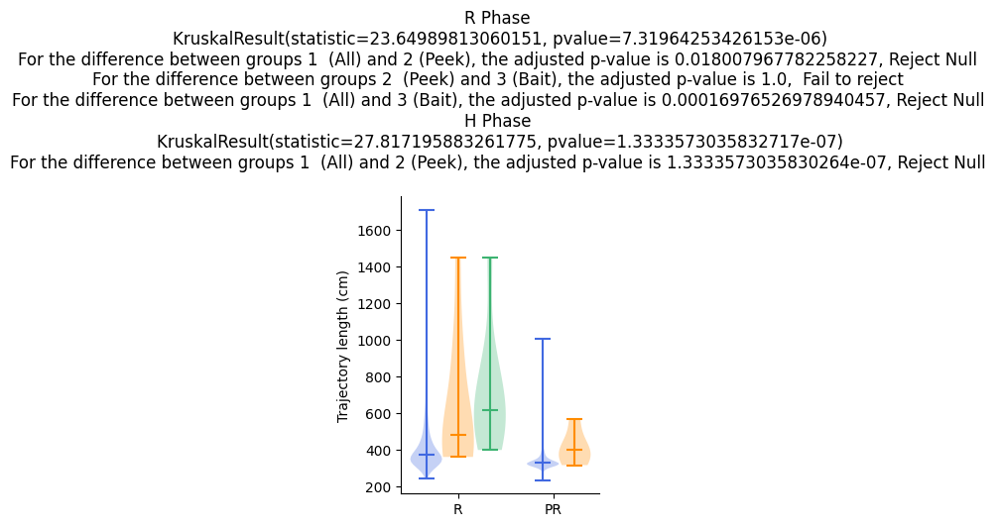

In [ ]:
# @title Panel A: Trajectory Length with Peek and Baiting

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as sp

def get_statisitics(data):
    sig_level = 0.05
    h , p = stats.kruskal(*data) # Kruskal-Wallis H-test
    p_values = sp.posthoc_dunn(data, p_adjust= 'bonferroni')  # Dunn's Testy
    a = str(stats.kruskal(*data)) + "\n"
    b = f'For the difference between groups 1  (All) and 2 (Peek), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"} \n'
    if len(data) == 3:
        c = f'For the difference between groups 2  (Peek) and 3 (Bait), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"} \n'
        d = f'For the difference between groups 1  (All) and 3 (Bait), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"} \n'
    else:
        c = ''
        d = ''
    return f"{a}{b}{c}{d}"


# selected bait and peek experiments
baiting_experiments = {'PEEK_20221121_1336_MMM10_21_05_RT6': [10], 'PEEK_20221123_1332_FMM10_21_05_RT1':[10, 16], 'PEEK_20221129_1124_MMM11_21_05_RT8': [8],
                       'PEEK_20230203_1010_FMM13_21_05_R2': [4], 'PEEK_20230201_1437_MMM14_21_05_R2': [18], 'PEEK_20221212_1522_FMM10_21_05_R2': [27],
                       'PEEK_20221205_1146_FMM10_21_05_RT7': [0], 'PEEK_20230201_1208_MMM13_21_05_RT4': [2], 'PEEK_20221202_1144_FMM10_21_05_RT6':[0] }
peeking_experiments = {'PEEK_20221208_1440_MMM11_21_05_H1': [5, 15, 22], 'PEEK_20221214_1316_FMM9_21_05_R2': [1], 'PEEK_20230127_1502_FMM14_21_05_RT2': [6],
                       'PEEK_20230207_1120_MMM13_21_05_H1': [5], 'PEEK_20221207_1331_MMM11_21_05_R2': [22], 'PEEK_20221205_1601_MMM10_21_05_H2': [43],
                       'PEEK_20221123_1332_FMM10_21_05_RT1': [15, 16], 'PEEK_20221117_1412_MMM11_21_05_RT2': [6, 7], 'PEEK_20230127_1406_MMM14_21_05_RT3': [37],
                       'PEEK_20221209_1023_FMM10_21_05_R1': [34], 'PEEK_20230130_1051_FMM13_21_05_RT1': [9]}

# load and format data
DownloadDataFile("df.pkl")
df = pd.read_pickle(DataFile("df.pkl"))
df['prey_trajectory_length_cm'] = df['prey_trajectory_length_canonical'] * 2.34 * 100    # convert trajectory length from canonical to cm
df.mouse = [i[3] for i in df.experiment.str.split('_')]

# create bait df
result_row_list = []
for key, value in baiting_experiments.items():
    for i in value:
        result_row = df[(df['experiment'] == key) & (df['ep_num'] == i)]
        result_row_list.append(result_row)
baiting_df = pd.concat(result_row_list, ignore_index=True)


# create peek df
result_row_list = []
for key, value in peeking_experiments.items():
    for i in value:
        result_row = df[(df['experiment'] == key) & (df['ep_num'] == i)]
        result_row_list.append(result_row)
peeking_df = pd.concat(result_row_list, ignore_index=True)


fig = plt.figure(figsize =(2, 3), facecolor=(1, 1, 1))
ax = fig.add_axes([0, 0, 1, 1])
dependent_variable = 'prey_trajectory_length_cm'

# Generate example data
condition = df['suffix3'] == 'R'
data1 = df.loc[condition, dependent_variable] #.tolist()
condition = peeking_df['suffix3'] == 'R'
data2 = peeking_df.loc[condition, dependent_variable].tolist()
data3 = baiting_df[dependent_variable].tolist()
condition = df['suffix3'] == 'H'
data4 = df.loc[condition, dependent_variable].tolist()
condition = peeking_df['suffix3'] == 'H'
data5 = peeking_df.loc[condition, dependent_variable].tolist()


# Combine data into a list of arrays
data = [data1, data2, data3, data4, data5]

# Create a violin plot
positions = [0.1, 0.4, 0.7, 1.2, 1.5]
violins = plt.violinplot(data, positions=positions, showmedians=True, widths = 0.3)

# Customize the plot
plt.xticks([0.4, 1.3], ['R', 'PR'])  # Set a single tick for all violins
plt.ylabel('Trajectory length (cm)')

# Customize colors and labels
colors = ['royalblue', 'darkorange', 'mediumseagreen', 'royalblue', 'darkorange']
for part, color in zip(violins['bodies'], colors):
    part.set_facecolor(color)
for partname in ('cbars','cmins','cmaxes','cmedians'):
    vp = violins[partname]
    vp.set_color(colors)
labels = ['All trials', 'Peek trials', 'Bait trials']

# Show the plot
plt.title("R Phase \n"+ get_statisitics([data1, data2, data3]) + "H Phase \n" + get_statisitics([data3, data4]))
for pos in ['top', 'right']:
    plt.gca().spines[pos].set_visible(False)
plt.show()




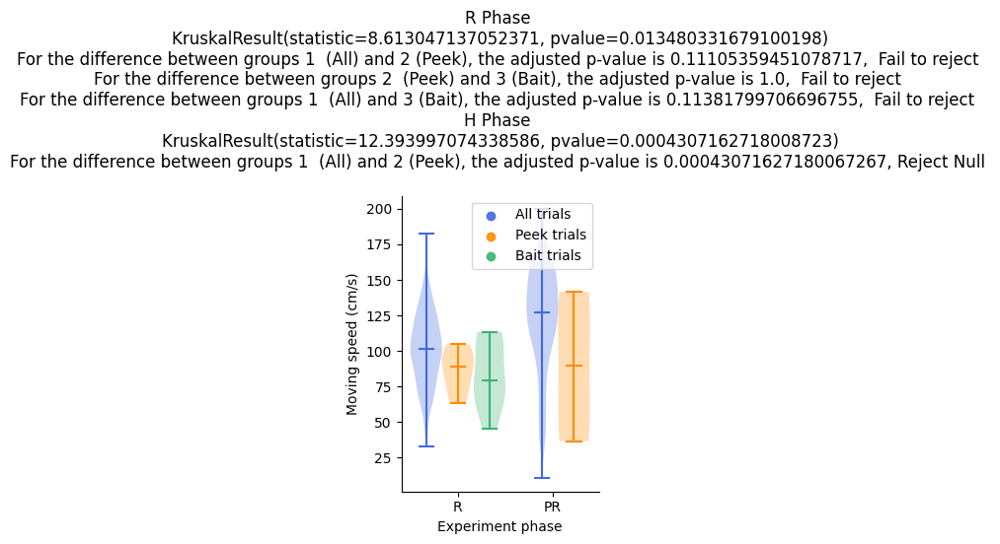

In [ ]:
# @title Panel B: Moving Speed with Peeking and Baiting

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

#  Figure code

import numpy as np
import matplotlib.pyplot as plt
import os
import json
from scipy import stats
import scikit_posthocs as sp


def get_statisitics(data):
    sig_level = 0.05
    h , p = stats.kruskal(*data) # Kruskal-Wallis H-test
    p_values = sp.posthoc_dunn(data, p_adjust= 'bonferroni')  # Dunn's Testy
    a = str(stats.kruskal(*data)) + "\n"
    b = f'For the difference between groups 1  (All) and 2 (Peek), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"} \n'
    if len(data) == 3:
        c = f'For the difference between groups 2  (Peek) and 3 (Bait), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"} \n'
        d = f'For the difference between groups 1  (All) and 3 (Bait), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"} \n'
    else:
        c = ''
        d = ''
    return f"{a}{b}{c}{d}"


# selected bait and peek experiments
baiting_experiments = {'PEEK_20221121_1336_MMM10_21_05_RT6': [10], 'PEEK_20221123_1332_FMM10_21_05_RT1':[10, 16], 'PEEK_20221129_1124_MMM11_21_05_RT8': [8],
                       'PEEK_20230203_1010_FMM13_21_05_R2': [4], 'PEEK_20230201_1437_MMM14_21_05_R2': [18], 'PEEK_20221212_1522_FMM10_21_05_R2': [27],
                       'PEEK_20221205_1146_FMM10_21_05_RT7': [0], 'PEEK_20230201_1208_MMM13_21_05_RT4': [2], 'PEEK_20221202_1144_FMM10_21_05_RT6':[0] }
peeking_experiments = {'PEEK_20221208_1440_MMM11_21_05_H1': [5, 15, 22], 'PEEK_20221214_1316_FMM9_21_05_R2': [1], 'PEEK_20230127_1502_FMM14_21_05_RT2': [6],
                       'PEEK_20230207_1120_MMM13_21_05_H1': [5], 'PEEK_20221207_1331_MMM11_21_05_R2': [22], 'PEEK_20221205_1601_MMM10_21_05_H2': [43],
                       'PEEK_20221123_1332_FMM10_21_05_RT1': [15, 16], 'PEEK_20221117_1412_MMM11_21_05_RT2': [6, 7], 'PEEK_20230127_1406_MMM14_21_05_RT3': [37],
                       'PEEK_20221209_1023_FMM10_21_05_R1': [34], 'PEEK_20230130_1051_FMM13_21_05_RT1': [9]}

# load and format data
DownloadDataFile("df.pkl")
df = pd.read_pickle(DataFile("df.pkl"))
df['prey_trajectory_length_cm'] = df['prey_trajectory_length_canonical'] * 2.34 * 100    # convert trajectory length from canonical to cm
df.mouse = [i[3] for i in df.experiment.str.split('_')]

# create bait df
result_row_list = []
for key, value in baiting_experiments.items():
    for i in value:
        result_row = df[(df['experiment'] == key) & (df['ep_num'] == i)]
        result_row_list.append(result_row)
baiting_df = pd.concat(result_row_list, ignore_index=True)


# create peek df
result_row_list = []
for key, value in peeking_experiments.items():
    for i in value:
        result_row = df[(df['experiment'] == key) & (df['ep_num'] == i)]
        result_row_list.append(result_row)
peeking_df = pd.concat(result_row_list, ignore_index=True)


fig = plt.figure(figsize =(2, 3), facecolor=(1, 1, 1))
ax = fig.add_axes([0, 0, 1, 1])
dependent_variable = 'avg_mouse_moving_velocities_cms'
x_label = 'Experiment phase'
y_label = 'Moving speed (cm/s)'

# Generate example data
condition = df['suffix3'] == 'R'
data1 = df.loc[condition, dependent_variable].tolist()
data1  = [value for value in data1  if not np.isnan(value)]
condition = peeking_df['suffix3'] == 'R'
data2 = peeking_df.loc[condition, dependent_variable].tolist()
data3 = baiting_df[dependent_variable].tolist()
condition = df['suffix3'] == 'H'
data4 = df.loc[condition, dependent_variable].tolist()
data4  = [value for value in data4  if not np.isnan(value)]
condition = peeking_df['suffix3'] == 'H'
data5 = peeking_df.loc[condition, dependent_variable].tolist()


# Combine data into a list of arrays
data = [data1, data2, data3, data4, data5]

# Create a violin plot
positions = [0.1, 0.4, 0.7, 1.2, 1.5]
violins = plt.violinplot(data, positions=positions, showmedians=True, widths = 0.3)

# Customize the plot
plt.xticks([0.4, 1.3], ['R', 'PR'])  # Set a single tick for all violins
plt.ylabel('Trajectory length (cm)')

# Customize colors
colors = ['royalblue', 'darkorange', 'mediumseagreen', 'royalblue', 'darkorange']
for part, color in zip(violins['bodies'], colors):
    part.set_facecolor(color)
for partname in ('cbars','cmins','cmaxes','cmedians'):
    vp = violins[partname]
    vp.set_color(colors)
labels = ['All trials', 'Peek trials', 'Bait trials']

scatter_labels = [plt.scatter([], [], color=color, alpha=0.9, label=label) for color, label in zip(['royalblue', 'darkorange', 'mediumseagreen'], labels)]
plt.legend(handles=scatter_labels)
plt.ylabel(y_label)
plt.xlabel(x_label)

# Show the plot
plt.title("R Phase \n"+ get_statisitics([data1, data2, data3]) + "H Phase \n" + get_statisitics([data3, data4]))
for pos in ['top', 'right']:
    plt.gca().spines[pos].set_visible(False)
plt.show()


KruskalResult(statistic=1114.0848544048422, pvalue=1.2010129216767397e-242)
For the difference between groups 1  (All) and 2 (peek), the adjusted p-value is 0.03525396748898657, Reject Null
For the difference between groups 2  (peek) and 3 (bait), the adjusted p-value is 1.0,  Fail to reject
For the difference between groups 1  (All) and 3 (bait), the adjusted p-value is 0.0018896487154648057, Reject Null
KruskalResult(statistic=1114.0848544048422, pvalue=1.2010129216767397e-242)
For the difference between groups 1  (All) and 2 (peek), the adjusted p-value is 1.1101401220568717e-06, Reject Null


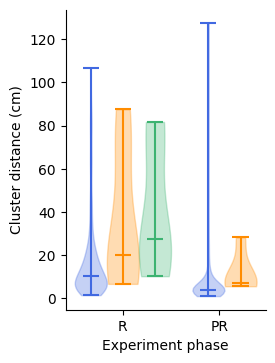

In [ ]:
#@title Panel C: Cluster Distance with Peeking and Baiting

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes


#  Figure code

import matplotlib.pyplot as plt
import json
import numpy as np
import scipy as sp
from statistics import median

import statistics
from scipy.stats import f_oneway, rankdata, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scikit_posthocs as scp


phases = [("HT", ""), ("R", ""), ("H", "")]

DownloadDataFile('supp_cluster_results_dict.json')
DownloadDataFile('peek_cluster_dict.json')
DownloadDataFile('baiting_cluster_dict.json')

cluster_results_dict = json.load(open(DataFile('supp_cluster_results_dict.json')))
peek_metrics_dict = json.load(open(DataFile('peek_cluster_dict.json')))
baiting_metrics_dict = json.load(open(DataFile('baiting_cluster_dict.json')))

data = []
for phase, phase_suffix in phases:
    data.append(cluster_results_dict[phase]['clus_distances'])
    pmedian = median(cluster_results_dict[phase]['clus_distances'])
    iqr = sp.stats.iqr(cluster_results_dict[phase]['clus_distances'])
    # print(f'phase: {phase}\n median: {pmedian/10}')
    # print(f'IQR:{iqr/10}')

spread = np.linspace(-1, 1, num=10)

# create boxplot
fig = plt.figure(figsize =(2, 3), facecolor=(1, 1, 1))
# Creating axes instance
ax = fig.add_axes([0, 0, 1, 1])
#Plot boxplot
bp = plt.violinplot(data[1:], showmedians = True, positions=[.1, 1.2],widths= 0.3)
ax.set_xticks([0.4,1.3])
ax.set_xticklabels(['R', 'PR'])
width = 0.075/2
alpha = 0.6
#Peeking scatter points
peek_p = plt.violinplot([[v*10 for v in peek_metrics_dict['R']], [v*10 for v in peek_metrics_dict['H']]],
                        showmedians = True, positions=[.4, 1.5], widths = 0.3)

#Baiting scater points
bait_p = plt.violinplot([v*10 for v in baiting_metrics_dict['R']], showmedians = True, positions=[.7], widths = 0.3)

# edit violinplot appearance
colors = ["royalblue",  "royalblue"]
for i,patch in enumerate(bp['bodies']):
  patch.set_facecolor(colors[i])
  patch.set_edgecolor(colors[i])
for partname in ('cbars','cmins','cmaxes','cmedians'):
  vp = bp[partname]
  vp.set_color(colors)
  # vp.set_linewidth(1)

#edit peeking appearance
colors = ["darkorange",  "darkorange"]
for i,patch in enumerate(peek_p['bodies']):
  patch.set_facecolor(colors[i])
  patch.set_edgecolor(colors[i])
for partname in ('cbars','cmins','cmaxes','cmedians'):
  vp = peek_p[partname]
  vp.set_color(colors)
  # vp.set_linewidth(1)

#edit baiting appearance
colors = ["mediumseagreen"]
for i,patch in enumerate(bait_p['bodies']):
  patch.set_facecolor(colors[i])
  patch.set_edgecolor(colors[i])
for partname in ('cbars','cmins','cmaxes','cmedians'):
  vp = bait_p[partname]
  vp.set_color(colors)
  # vp.set_linewidth(1)


# show plot
ax.set_xlabel('Experiment phase')
ax.set_ylabel('Cluster distance (cm)')
ax.set_yticks(np.linspace(0, 1200, 7))
ax.set_yticklabels([int(j) for j in (np.linspace(0, 1200, 7)/10)])

for pos in ['top', 'right']:
    plt.gca().spines[pos].set_visible(False)

base_output = '/content/drive/MyDrive/MacIver Lab: Habitat/hab_methods/code/CodeFigures/'
# fig.savefig(base_output + "cluster_distance_peeks_and_baits.pdf",  dpi=300, bbox_inches='tight')


#RUN STATISTICS for PEEKING
sig_level = 0.05
data_set = [data[1:2][0], [v*10 for v in peek_metrics_dict['R']], [v*10 for v in baiting_metrics_dict['R']]]

# Kruskal-Wallis H-test
print(kruskal(*data))
h , p = kruskal(*data)

# Dunn's Test
p_values = scp.posthoc_dunn(data_set, p_adjust= 'bonferroni')  # format data properly

comp1 = f'For the difference between groups 1  (All) and 2 (peek), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"}'
comp2 = f'For the difference between groups 2  (peek) and 3 (bait), the adjusted p-value is {p_values.iat[1,2]}, {"Reject Null" if p_values.iat[1,2] < sig_level else " Fail to reject"}'
comp3 = f'For the difference between groups 1  (All) and 3 (bait), the adjusted p-value is {p_values.iat[2,0]}, {"Reject Null" if p_values.iat[2,0] < sig_level else " Fail to reject"}'
print(comp1)
print(comp2)
print(comp3)

#RUN STATISTICS for BAITING
data_set = [data[2:3][0], [v*10 for v in baiting_metrics_dict['R']]]

# Kruskal-Wallis H-test
print(kruskal(*data))
h , p = kruskal(*data)

# Dunn's Test
p_values = scp.posthoc_dunn(data_set, p_adjust= 'bonferroni')  # format data properly
comp4 = f'For the difference between groups 1  (All) and 2 (peek), the adjusted p-value is {p_values.iat[0,1]}, {"Reject Null" if p_values.iat[0,1] < sig_level else " Fail to reject"}'
print(comp4)


## Figure 5

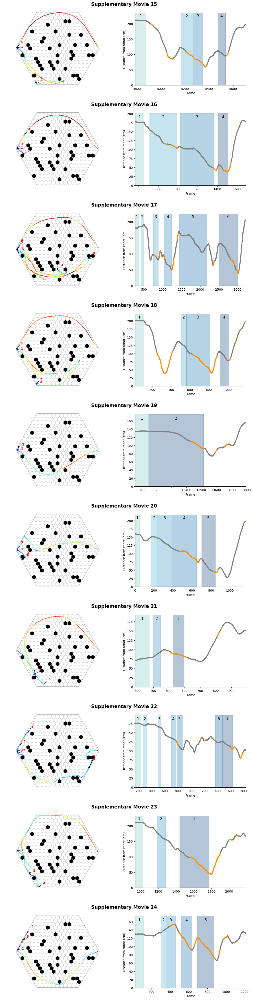

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

In [ ]:
# @title Panel A-J: Additional Baiting Examples

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

experiment_files = Experiment_list

#  Figure code

from cellworld import *
import os
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.collections import LineCollection

occlusions = '21_05'
w = World.get_from_parameters_names('hexagonal',"canonical",occlusions)

DownloadDataFile("bait_supplementary_df.pkl")
df = pd.read_pickle(DataFile("bait_supplementary_df.pkl"))

fig, axs = plt.subplots(10, 2, figsize=(14,57))
fig.subplots_adjust(wspace = 0.2)  # Adjust hspace as needed

movie_count = 15
for index, row in df.iterrows():
    stop_steps = row['stop_steps']
    stop_durations = row['stop_durations']
    prey_frames = row['prey_frames']
    distance = row['distance']
    visibility = row['visibility']
    trajectory = row['prey_trajectory']
    prey_speed = row['prey_speed']



    ### COL 0 ###
    d = Display(w, padding=0, cell_edge_color="lightgrey", background_color="white", habitat_edge_color="darkgrey", ax = axs[index, 0])
    speeds = np.array(prey_speed)
    prey_x, prey_y = trajectory.T


    # prey trajectory with speed color map
    cmap = cm.jet
    norm = plt.Normalize(0, 200)
    segments = np.column_stack([prey_x, prey_y]).reshape(len(prey_x), 1, 2)
    points = np.array([prey_x, prey_y]).T.reshape(len(prey_x), 1, 2)
    segments = np.concatenate([segments[:-1], points[1:]], axis=1)
    lc = LineCollection(segments, cmap=cmap, norm=norm, linewidth=2, alpha = 0.75)
    lc.set_array(speeds)
    axs[index, 0].add_collection(lc)

    prev_positions = []
    increment = 0
    cutoff = 0
    for i, stop in enumerate(stop_steps):
        if i == 0:
            initial_stop = stop[1].frame- stop[0].frame
            if stop[1].frame- stop[0].frame > 90:
                cutoff = stop[1].frame - 90
            else:
                cutoff = 0
        stop = stop[0]

        x, y = stop.location.x, stop.location.y
        offset_x, offset_y = 15, increment
        axs[index, 0].annotate(f"{i+1}", (x, y), textcoords="offset points", ha='center', zorder = 100, fontweight='bold', fontsize=10, xytext=(offset_x, offset_y),
                               arrowprops=dict(facecolor='black', edgecolor='black', arrowstyle='-', linewidth=1), color = 'red')
        axs[index, 0].scatter(x,y, edgecolors= 'black', facecolor = 'none', marker = 'o',zorder = 100, linewidths= 1, s = 10)
        increment += 5

    axs[index, 0].axis('off')
    axs[index, 0].set_aspect('equal', adjustable='datalim')


    ### COL 1 ###
    pause_color_map = plt.cm.GnBu
    pause_colors_iter = iter(pause_color_map(np.linspace(0.5, 1, len(stop_durations))))
    ci = 0
    for stop, duration in zip(stop_steps, stop_durations):
        x1 = stop[0].frame
        x2 = stop[1].frame
        pause_current_color = next(pause_colors_iter)
        axs[index,1].axvspan(x1, x2, alpha=0.3, color=pause_current_color, zorder = -1)
        if ci == 0 and cutoff:
            axs[index,1].text((cutoff + x2)/2 , max(distance) + 10, f'{ci + 1}', ha='center', va='center', color='black', fontsize= 12)#, backgroundcolor='white')
        else:

            axs[index,1].text((x1 + x2) / 2, max(distance) + 10, f'{ci + 1}', ha='center', va='center', color='black', fontsize= 12)#, backgroundcolor='white')
        ci +=1

    b1 = 0
    b2 = len(prey_frames)

    time = prey_frames[b1:b2]
    axs[index, 1].plot(time, distance[b1:b2], color='grey')
    bool_color = ['darkorange' if value else 'grey' for value in visibility[b1:b2]]
    axs[index, 1].scatter(time, distance[b1:b2], color=bool_color, s = 6, zorder = 10)
    axs[index, 1].set_xlabel('Frame', color='black')
    axs[index, 1].set_ylabel('Distance from robot (cm)', color='black')
    axs[index, 1].spines['right'].set_visible(False)
    axs[index, 1].spines['top'].set_visible(False)
    axs[index, 1].set_xlim([cutoff, max(prey_frames)])
    axs[index, 1].set_ylim([0,max(distance) + 20])
    axs[index,1].set_aspect('auto', adjustable='datalim')

    hspace_factor = -0.009
    shift_factor =  0.004
    pos = axs[index, 1].get_position()
    axs[index, 1].set_position([pos.x0, pos.y0 + shift_factor , pos.width, pos.height + hspace_factor])

    fig.text((pos.x0 + axs[i, 0].get_position().x1) / 2, pos.y1 , f'Supplementary Movie {movie_count}', ha='center', va='bottom', weight='bold', fontsize = 15)
    movie_count += 1



## Figure 6

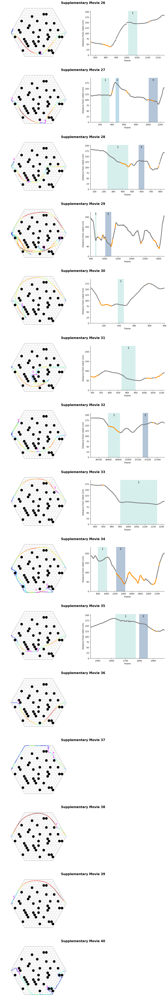

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

In [ ]:
# @title Panel A-O: Additional Peeking Examples

# Common cell setup

%reset -f
!mkdir /content/data -p

from json_cpp import JsonObject
from cellworld import Episode_list
import pandas as pd


def DownloadDataFile(file_name:str, is_zipped:bool = False):
  import requests
  import os
  import zipfile

  if is_zipped:
    full_filename = file_name + ".zip"
  else:
    full_filename = file_name

  data_path = "/content/data"
  full_path = "%s/%s" % (data_path, full_filename)

  if os.path.exists(full_path):
    return

  data = requests.get("https://raw.githubusercontent.com/cellworld-neuro/public_data/main/%s" % full_filename)
  dir_name = os.path.dirname(full_path)
  os.makedirs(dir_name, exist_ok=True)
  with open (full_path, "wb") as f:
    f.write(data.content)
    f.close()
  if is_zipped:
    with zipfile.ZipFile(full_path, 'r') as zip_ref:
      zip_ref.extractall(data_path)

def DataFile(file_name:str)-> str:
  full_path = "/content/data/%s" % file_name
  return full_path

DownloadDataFile("experiments/experiment_list.json")
Experiment_list = JsonObject.load_from_file(DataFile("experiments/experiment_list.json"))

def GetEpisodes(phase="", subject="", iterations=[]):
  def filter(experiment):
    return (experiment.phase == phase or phase == "") and (experiment.subject == subject or subject=="") and (experiment.iteration in iterations or iterations==[])
  experiment_files = Experiment_list.filter(key=filter)

  episodes = Episode_list()
  for experiment_file in experiment_files:
      DownloadDataFile(experiment_file.file)
      e = pd.read_hdf(DataFile(experiment_file.file))
      for k, ep in e.iloc[:].iterrows():
          if ep['bad_episode'] == 1:
              continue
          episode = ep['ep_data']
          episodes.append(episode)
  return episodes

experiment_files = Experiment_list

for f in experiment_files:
  DownloadDataFile(f.file)
  #df = pd.read_hdf(DataFile(f.file))

#  Figure code

from cellworld import *
import os
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.collections import LineCollection

occlusions = '21_05'
w = World.get_from_parameters_names('hexagonal',"canonical",occlusions)



DownloadDataFile("peek_supplementary_df.pkl")
df = pd.read_pickle(DataFile("peek_supplementary_df.pkl"))
fig, axs = plt.subplots(15, 2, figsize=(14,85.5))
fig.subplots_adjust(wspace = 0.2)

movie_count = 26
for index, row in df.iterrows():

    peek_steps = row['peek_steps']
    peek_durations = row['peek_durations']
    prey_frames = row['prey_frames']
    distance = row['distance']
    visibility = row['visibility']
    prey_trajectory = row['prey_trajectory']
    prey_speed = row['prey_speed']
    peek_segments = row['peek_segments']


    ### COL 0 ###
    d = Display(w, padding=0, cell_edge_color="lightgrey", background_color="white", habitat_edge_color="darkgrey", ax = axs[index, 0])
    prey_speed = np.array(prey_speed)
    prey_x, prey_y = prey_trajectory.T


    # plot prey trajectory using linecollection and cmap to capture velocity
    cmap = cm.jet
    norm = plt.Normalize(0, 200)
    segments = np.column_stack([prey_x, prey_y]).reshape(len(prey_x), 1, 2)
    points = np.array([prey_x, prey_y]).T.reshape(len(prey_x), 1, 2)
    segments = np.concatenate([segments[:-1], points[1:]], axis=1)
    lc = LineCollection(segments, cmap=cmap, norm=norm, linewidth=2, alpha = 0.75)
    lc.set_array(prey_speed)
    axs[index, 0].add_collection(lc)

    # plot and label peek postions
    prev_positions = []
    increment = 0
    cutoff = 0
    for i, step in enumerate(peek_steps):
        step = step[0]
        x, y = step.location.x, step.location.y

        offset_x, offset_y = 0, 10
        axs[index, 0].annotate(f"{i+1}", (x, y), textcoords="offset points", ha='center', zorder = 100, fontweight='bold', fontsize=10, xytext=(offset_x, offset_y),
                                color = 'magenta')

    # plot peek segment
    for seg in peek_segments:
        x, y = seg.T
        axs[index, 0].plot( x, y, color = 'magenta', zorder = 100)

    axs[index, 0].axis('off')
    axs[index, 0].set_aspect('equal', adjustable='datalim')


    ### COL 1 ###
    if distance:
        peek_color_map = plt.cm.GnBu
        peek_colors_iter = iter(peek_color_map(np.linspace(0.5, 1, len(peek_durations))))

        ci = 0
        cutoff = 0
        for steps, duration in zip(peek_steps, peek_durations):
            # determine cutoff
            if ci == 0:
                if steps[0].frame > 180:
                    cutoff = steps[0].frame - 180
                else:
                    cutoff = 0


            # shaded peek region
            x1 = steps[0].frame # start
            x2 = steps[1].frame # end
            pause_current_color = next(peek_colors_iter)
            axs[index,1].axvspan(x1, x2, alpha=0.3, color=pause_current_color, zorder = -1)

            # label peek region
            axs[index,1].text((x1 + x2) / 2, max(distance) + 10, f'{ci + 1}', ha='center', va='center', color='black', fontsize= 12)#, backgroundcolor='white')
            ci +=1

        b1 = 0
        b2 = len(prey_frames)


        axs[index, 1].plot( prey_frames[b1:b2], distance[b1:b2], color='grey')
        bool_color = ['darkorange' if value else 'grey' for value in visibility[b1:b2]]
        axs[index, 1].scatter( prey_frames[b1:b2], distance[b1:b2], color=bool_color, s = 6, zorder = 10)
        axs[index, 1].set_xlabel('Frame', color='black')
        axs[index, 1].set_ylabel('Distance from robot (cm)', color='black')
        axs[index, 1].spines['right'].set_visible(False)
        axs[index, 1].spines['top'].set_visible(False)
        axs[index, 1].set_xlim([cutoff, max(prey_frames)])
        axs[index, 1].set_ylim([0,max(distance) + 20])
        if row['experiment'] == 'PEEK_20221207_1331_MMM11_21_05_R2':
            axs[index, 1].set_xlim([cutoff, 500])
        axs[index,1].set_aspect('auto', adjustable='datalim')

    else:
      axs[index, 1].axis('off')


    hspace_factor = -0.009
    shift_factor =  0.004
    pos = axs[index, 1].get_position()
    axs[index, 1].set_position([pos.x0, pos.y0 + shift_factor , pos.width, pos.height + hspace_factor])
    fig.text((pos.x0 + axs[i, 0].get_position().x1) / 2, pos.y1 , f'Supplementary Movie {movie_count}', ha='center', va='bottom', weight='bold', fontsize = 15)

    movie_count += 1